# Data extraction and transformation for Brazil


This notebook is part of the project "New Schools Location in Brazil" and it is focused on the data extraction and transformation for Brazil.


## Step 0. Import libraries and setup environment


In [1]:
# Ignore warnings
import warnings

warnings.filterwarnings("ignore")

In [2]:
import os

## Libraries installed with urbanpy ##
## pip install urbanpy==0.2.2-dev0 ##
import urbanpy as up

# Data Science Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.preprocessing import MultiLabelBinarizer, LabelBinarizer

# Geospatial Libraries
import geopandas as gpd
import osmnx as ox
from shapely.geometry.point import Point


# Progress Bar
from tqdm.auto import tqdm

## Other Libraries commonly used for maps ##
import contextily as cx  # Add basemaps
from matplotlib_scalebar.scalebar import ScaleBar

import geobr

In [3]:
tqdm.pandas()

In [4]:
# Set parameters for basemaps
from secret import *

BASEMAP = cx.providers.MapBox(
    id="mapbox/satellite-v9",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_WITH_LABELS = cx.providers.MapBox(
    id="mapbox/satellite-streets-v12",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_WHITE = cx.providers.MapBox(
    id="mapbox/light-v10",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_DARK = cx.providers.MapBox(
    id="mapbox/dark-v10",
    accessToken=MAPBOX_API_KEY,
)

## Step 1. Define Area of Interest (AoI)


For this, we will:

- Download a administrative limits for Brazil, and get the multi-level admistrative limits of Pará usig the geoBR library.
- Read schools data downloaded using the R package CensoBr.


In [5]:
os.mkdir("../outputs") if not os.path.exists("../outputs") else None
if os.path.exists("../outputs/brazil_state.geojson"):
    brazil = gpd.read_file("../outputs/brazil_state.geojson")
else:
    brazil = geobr.read_country(year=2020, simplified=True, verbose=True)
    brazil.to_file("../outputs/brazil_state.geojson", driver="GeoJSON")

In [6]:
brazil.head()

,code_state,abbrev_state,name_state,code_region,name_region,geometry
0,11.0,RO,Rondônia,1.0,Norte,"MULTIPOLYGON (((-65.38150 -10.42907, -65.37916..."
1,12.0,AC,Acre,1.0,Norte,"MULTIPOLYGON (((-71.07772 -9.82774, -71.08554 ..."
2,13.0,AM,Amazônas,1.0,Norte,"MULTIPOLYGON (((-69.83766 -3.68659, -69.71230 ..."
3,14.0,RR,Roraima,1.0,Norte,"MULTIPOLYGON (((-63.96008 2.47313, -63.96041 2..."
4,15.0,PA,Pará,1.0,Norte,"MULTIPOLYGON (((-51.43248 -0.47334, -51.42843 ..."


In [7]:
brazil.abbrev_state

0     RO
1     AC
2     AM
3     RR
4     PA
5     AP
6     TO
7     MA
8     PI
9     CE
10    RN
11    PB
12    PE
13    AL
14    SE
15    BA
16    MG
17    ES
18    RJ
19    SP
20    PR
21    SC
22    RS
23    MS
24    MT
25    GO
26    DF
Name: abbrev_state, dtype: object

In [8]:
STATE_ABBREV = "SC"

In [9]:
# Area of Interest (AoI)
state = brazil.query(f"abbrev_state == '{STATE_ABBREV}'")

In [10]:
state.explore()

In [11]:
# Set parameters for scalebar
point1 = state.centroid.iloc[0]  # Para's center
point2 = Point(point1.x + 1, point1.y)  # One full degree of longitude (X) apart
points = gpd.GeoDataFrame(geometry=[point1, point2], crs=state.crs)
points_utm = ox.project_gdf(points)  # Projected - meters
dist_meters = points.geometry.iloc[0].distance(
    points.geometry.iloc[1]
)  # Distance - meters

Let's visualize of Area of Interest (AoI) - Pará - in Brazil


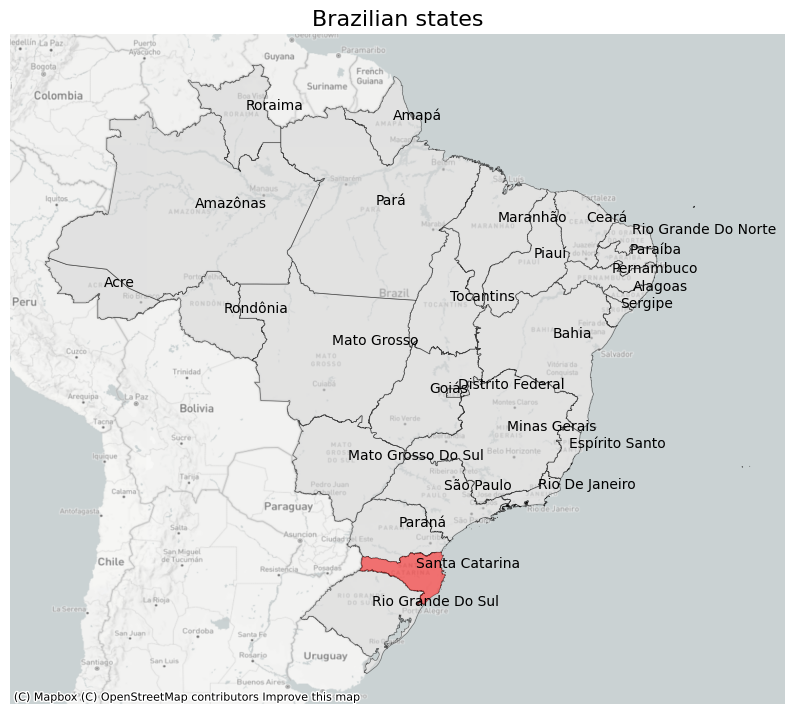

In [12]:
ax = brazil.plot(
    figsize=(10, 10), facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5
)
state.plot(ax=ax, color="red", alpha=0.5)

# Add name_state labels to the map
for x, y, label in zip(
    brazil.geometry.centroid.x, brazil.geometry.centroid.y, brazil["name_state"]
):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

# Add basemap
cx.add_basemap(ax, crs=brazil.crs.to_string(), source=BASEMAP_WHITE)

# Add scale bar
# ax.add_artist(ScaleBar(dist_meters))

ax.set_title("Brazilian states", fontsize=16)

# Remove axis
ax.set_axis_off()

# Save figure
os.makedirs(f"outputs/maps/{STATE_ABBREV}", exist_ok=True)
plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/01-brazil_states.png", dpi=300, bbox_inches="tight"
)

plt.show()

Since Pará is a really big state (1.28 km^2). We can explore intermediate administrative limits on which we can simplify the analysis.


In [13]:
if os.path.exists(f"outputs/data/{STATE_ABBREV}/intermediate_regions.geojson"):
    intermediate_regions = gpd.read_file(
        f"outputs/data/{STATE_ABBREV}/intermediate_regions.geojson"
    )
else:
    os.makedirs(f"outputs/data/{STATE_ABBREV}/", exist_ok=True)
    intermediate_regions = geobr.read_intermediate_region(
        code_intermadiate=STATE_ABBREV, year=2020
    )
    intermediate_regions.to_file(
        f"outputs/data/{STATE_ABBREV}/intermediate_regions.geojson", driver="GeoJSON"
    )

In [14]:
if os.path.exists(f"outputs/data/{STATE_ABBREV}/meso_regions.geojson"):
    meso_regions = gpd.read_file(f"outputs/data/{STATE_ABBREV}/meso_regions.geojson")
else:
    meso_regions = geobr.read_meso_region(code_meso=STATE_ABBREV, year=2020)
    meso_regions.to_file(
        f"outputs/data/{STATE_ABBREV}/meso_regions.geojson", driver="GeoJSON"
    )

In [15]:
if os.path.exists(f"outputs/data/{STATE_ABBREV}/micro_regions.geojson"):
    micro_regions = gpd.read_file(f"outputs/data/{STATE_ABBREV}/micro_regions.geojson")
else:
    micro_regions = geobr.read_micro_region(code_micro=STATE_ABBREV, year=2020)
    micro_regions.to_file(
        f"outputs/data/{STATE_ABBREV}/micro_regions.geojson", driver="GeoJSON"
    )

In [16]:
PATH = f"outputs/data/{STATE_ABBREV}/municipios.geojson"
if os.path.exists(PATH):
    municipios = gpd.read_file(PATH)
else:
    municipios = geobr.read_municipality(code_muni=STATE_ABBREV, year=2020)
    municipios.to_file(PATH, driver="GeoJSON")

In [17]:
municipios.to_parquet(f"outputs/data/{STATE_ABBREV}/municipios.parquet")
micro_regions.to_parquet(f"outputs/data/{STATE_ABBREV}/micro_regions.parquet")

Let's see the number of units and visualize each administrative level


In [18]:
pd.DataFrame(
    index=["Meso regions", "Intermediate regions", "Micro regions", "Municipalities"],
    data=[
        len(meso_regions),
        len(intermediate_regions),
        len(micro_regions),
        len(municipios),
    ],
    columns=["Number of units"],
)

,Number of units
Meso regions,6
Intermediate regions,7
Micro regions,20
Municipalities,295


<Axes: >

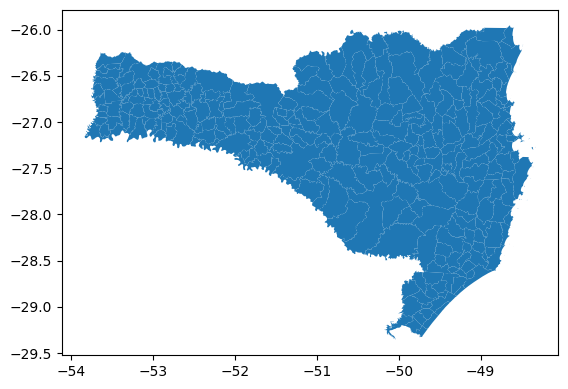

In [19]:
municipios.plot()

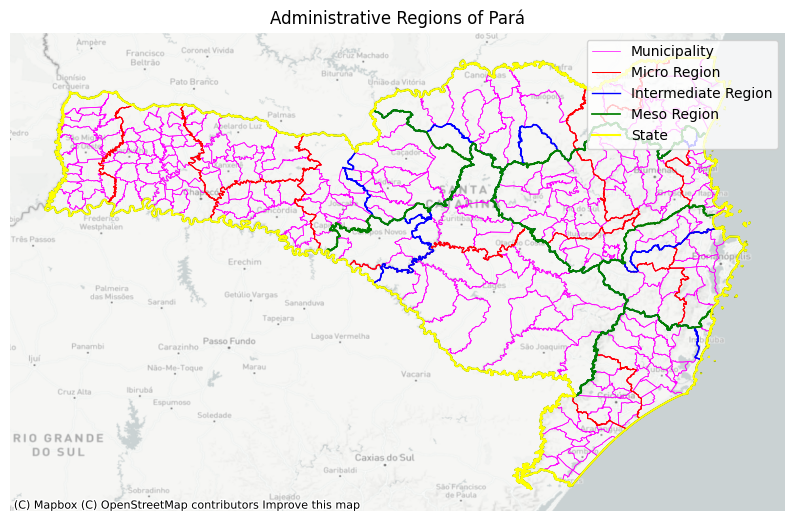

In [20]:
fig, ax = plt.subplots(figsize=(10, 10))

legend_labels = [
    "Municipality",
    "Micro Region",
    "Intermediate Region",
    "Meso Region",
    "State",
]
colors = ["magenta", "red", "blue", "green", "yellow"]
linewidths = [0.5, 0.75, 1, 1.25, 1.5]
admin_regions = [
    municipios,
    micro_regions,
    intermediate_regions,
    meso_regions,
    state,
]

legend_handles = []
for i, region in enumerate(admin_regions):
    region.plot(ax=ax, facecolor="none", edgecolor=colors[i], linewidth=linewidths[i])
    # Create line2D objects with labels
    legend_handles.append(
        plt.Line2D([0], [0], color=colors[i], linewidth=linewidths[i], linestyle="-")
    )

# Set title and legend
ax.set_title("Administrative Regions of Pará")
ax.legend(legend_handles, legend_labels, loc="upper right")

# Add basemap
cx.add_basemap(ax, crs=state.crs.to_string(), source=BASEMAP_WHITE)

# Add scale bar
# ax.add_artist(ScaleBar(dist_meters))

# Remove axis
ax.set_axis_off()

plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/02-adm_regions.png", dpi=300, bbox_inches="tight"
)

plt.show()

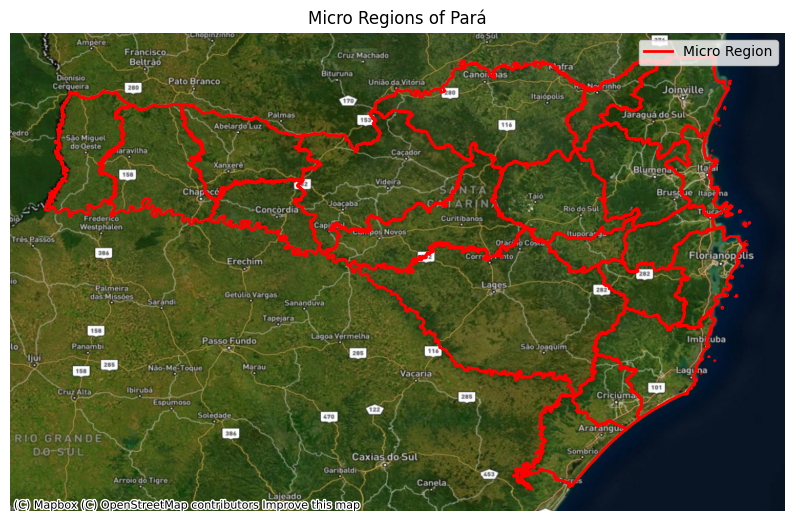

In [21]:
fig, ax = plt.subplots(figsize=(10, 10))

legend_labels = ["Micro Region"]
colors = ["red"]
linewidths = [2]
admin_regions = [micro_regions]

legend_handles = []
for i, region in enumerate(admin_regions):
    region.plot(ax=ax, facecolor="none", edgecolor=colors[i], linewidth=linewidths[i])
    # Create line2D objects with labels
    legend_handles.append(
        plt.Line2D([0], [0], color=colors[i], linewidth=linewidths[i], linestyle="-")
    )

# Set title and legend
ax.set_title("Micro Regions of Pará")
ax.legend(legend_handles, legend_labels, loc="upper right")

# Add basemap
cx.add_basemap(ax, crs=state.crs.to_string(), source=BASEMAP_WITH_LABELS)

# Add scale bar
# ax.add_artist(ScaleBar(dist_meters))

# Remove axis
ax.set_axis_off()

plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/03-micro_regions.png", dpi=300, bbox_inches="tight"
)

plt.show()

From the visualization we can see that:

- There is a clear overlaping between Meso and Intermediate regions, and they are too big.
- Municipalities could be grouped considering if they form a **contigous urban area**.
- **Micro regions are the chosen administrative level** for the analysis. They are more homogeneous than municipalities and they are not too big. In addition, bigger micro regions are the ones with forest reserves.


## Step 2. Extract and process Census Sociodemographic geographical data


### Step 2.1. Extracting Census Tracts Data from IBGE

Census Tract's Geometries are obtained in this notebook with the `GeoBR` Python library


In [22]:
if os.path.exists(f"outputs/data/{STATE_ABBREV}/census_tracts.geojson"):
    cntr = gpd.read_file(f"outputs/data/{STATE_ABBREV}/census_tracts.geojson")
else:
    cntr = geobr.read_census_tract(code_tract=STATE_ABBREV, year=2010)
    cntr.to_file(f"outputs/data/{STATE_ABBREV}/census_tracts.geojson", driver="GeoJSON")

In [23]:
print(f"Number of census tracts in {STATE_ABBREV}:", len(cntr))

Number of census tracts in SC: 12227


In [24]:
cntr.head()

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,code_state,geometry
0,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,42.0,"POLYGON ((-48.71157 -26.38866, -48.70895 -26.3..."
1,420130705000047,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,42.0,"POLYGON ((-48.82491 -26.44796, -48.82171 -26.4..."
2,420130705000048,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,42.0,"POLYGON ((-48.81705 -26.44451, -48.80901 -26.4..."
3,420130705000049,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,42.0,"POLYGON ((-48.81787 -26.43888, -48.81498 -26.4..."
4,420130705000050,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,42.0,"POLYGON ((-48.80829 -26.44212, -48.80166 -26.4..."


Let's visualize the census tracts in Pará to get a sense of their size and granularity


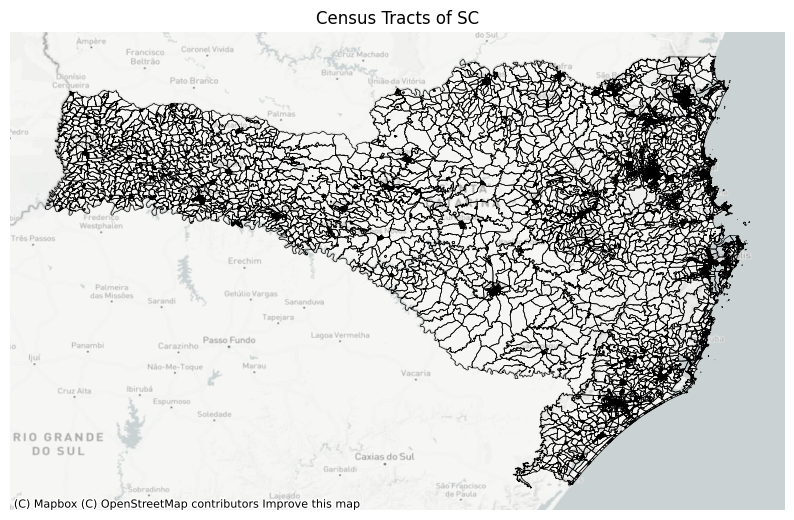

In [25]:
ax = cntr.plot(facecolor="none", edgecolor="black", linewidth=0.5, figsize=(10, 10))

# Set title and legend
ax.set_title(f"Census Tracts of {STATE_ABBREV}")

# Add basemap
cx.add_basemap(ax, crs=state.crs.to_string(), source=BASEMAP_WHITE)

# Remove axis
ax.set_axis_off()

plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/04-para_census_tracts.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

We can clearly visualize that the census tracts differ in size depeding on the geographical location. For example, near city centers, the census tracts are smaller, while in rural areas, the census tracts are bigger. This usually happens because in rural areas, the population is more sparse, so the census tracts are bigger to ensure that the population is represented in the census.


Now, we will read a [dataset generated with the `CensoBR` R package here](link-to-r-notebook). In this dataset we have census variables such as Income and Population by Age that are useful to identify areas where schools are needed.


In [26]:
censobr_tract_income = pd.read_parquet("../data/censobr_tract_income.parquet")

In [27]:
print("Number of census tracts obtained in R for Brazil:", len(censobr_tract_income))

Number of census tracts obtained in R for Brazil: 310120


In [28]:
censobr_tract_income.head()

,code_tract,V002,V003,pessoa13_V021,pessoa13_V022,pessoa13_V023,pessoa13_V024,pessoa13_V025,pessoa13_V026,pessoa13_V027,...,pessoa13_V044,pessoa13_V045,pessoa13_V046,pessoa13_V047,pessoa13_V048,pessoa13_V049,pessoa13_V050,pessoa13_V051,pessoa13_V052,income_pc
0,120001305000001,957.0,601805.0,0.0,8.0,0.0,0.0,0.0,1.0,0.0,...,16.0,22.0,20.0,26.0,17.0,23.0,22.0,14.0,17.0,628.845350
1,120001305000002,1203.0,385033.0,0.0,29.0,1.0,2.0,3.0,4.0,0.0,...,29.0,41.0,23.0,36.0,31.0,36.0,35.0,27.0,23.0,320.060682
2,120001305000003,1700.0,531794.0,0.0,41.0,4.0,2.0,4.0,3.0,1.0,...,47.0,39.0,31.0,35.0,27.0,51.0,21.0,37.0,34.0,312.820000
3,120001305000004,182.0,58853.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,4.0,6.0,4.0,4.0,3.0,2.0,2.0,4.0,7.0,323.368132
4,120001305000005,305.0,112979.0,0.0,5.0,1.0,1.0,0.0,0.0,0.0,...,5.0,6.0,4.0,7.0,3.0,5.0,5.0,9.0,9.0,370.422951


In [29]:
# Verify code_tract values have the same type in both datasets
print(f"Type of code_tract in {STATE_ABBREV}:", cntr.code_tract.dtype)
print(
    "Type of code_tract in censobr_tract_income:", censobr_tract_income.code_tract.dtype
)

Type of code_tract in SC: object
Type of code_tract in censobr_tract_income: object


In [30]:
cntr["code_tract"] = cntr["code_tract"].astype("int64")
censobr_tract_income["code_tract"] = censobr_tract_income["code_tract"].astype("int64")

In [31]:
print(
    "Number of census tracts with associated data:",
    censobr_tract_income["code_tract"].isin(cntr["code_tract"].unique()).sum(),
)
print(f'{len(cntr["code_tract"].unique())=}')

Number of census tracts with associated data: 11882
len(cntr["code_tract"].unique())=12227


In [32]:
# Merge datasets to visualize census data in maps
cntr_income = cntr.merge(
    censobr_tract_income, left_on="code_tract", right_on="code_tract", how="left"
)

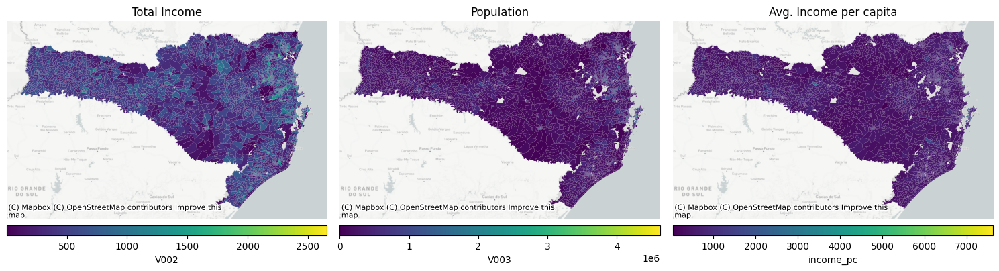

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

cols = ["V002", "V003", "income_pc"]
titles = ["Total Income", "Population", "Avg. Income per capita"]

for ax, col, title in zip(axes, cols, titles):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.1)
    cntr_income.plot(
        ax=ax,
        column=col,
        cmap="viridis",
        cax=cax,
        legend=True,
        legend_kwds={"label": col, "orientation": "horizontal"},
        missing_kwds={"color": "lightgrey", "alpha": 0.5},
    )
    ax.set_title(title)
    ax.set_axis_off()
    cx.add_basemap(ax, crs=state.crs.to_string(), source=BASEMAP_WHITE)

plt.tight_layout()

plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/05-census_tract_data.png",
    dpi=300,
    bbox_inches="tight",
)

6.16 Arquivo Idade, total (planilha Pessoa13_UF.xls ou Pessoa13_UF.csv)

| Nome da variável | Descrição da variável         |
| ---------------- | ----------------------------- |
| V026             | Pessoas com 3 meses de idade  |
| V027             | Pessoas com 4 meses de idade  |
| V028             | Pessoas com 5 meses de idade  |
| V029             | Pessoas com 6 meses de idade  |
| V030             | Pessoas com 7 meses de idade  |
| V031             | Pessoas com 8 meses de idade  |
| V032             | Pessoas com 9 meses de idade  |
| V033             | Pessoas com 10 meses de idade |
| V034             | Pessoas com 11 meses de idade |
| V035             | Pessoas de 1 ano de idade     |
| V036             | Pessoas com 2 anos de idade   |
| V037             | Pessoas com 3 anos de idade   |

BASE DE INFORMAÇÕES POR SETOR CENSTÁRIO  
Página 140-142  
ANO - 2010


In [114]:
# Creche: Between 3 months and 5 years old
cols_creche = [f"pessoa13_V{i:03d}" for i in range(26, 38)]
cntr_income["pop_3_months_3_years"] = cntr_income[cols_creche].sum(axis=1)
# Pre-scola: Between 4 and 5 years old
cols_pre_school = [f"pessoa13_V{i:03d}" for i in range(38, 40)]
cntr_income["pop_4_5_years"] = cntr_income[cols_pre_school].sum(axis=1)
# Fund. Anos Iniciais: Between 6 and 10 years old
cols_fundamental_inicias = [f"pessoa13_V{i:03d}" for i in range(40, 45)]
cntr_income["pop_6_10_years"] = cntr_income[cols_fundamental_inicias].sum(axis=1)
# Fund. Anos Finais: Between 11 and 14 years old
cols_fundamental_finais = [f"pessoa13_V{i:03d}" for i in range(45, 49)]
cntr_income["pop_11_14_years"] = cntr_income[cols_fundamental_finais].sum(axis=1)
cols_fundamental = cols_fundamental_inicias + cols_fundamental_finais
# Ensino Médio: Between 15 and 17 years old
cols_medio = [f"pessoa13_V{i:03d}" for i in range(49, 52)]
cntr_income["pop_15_17_years"] = cntr_income[cols_medio].sum(axis=1)
# Ensino Profissional: 18 years old
cols_superior = ["pessoa13_V052"]
cntr_income["pop_18_years"] = cntr_income[cols_superior].sum(axis=1)

In [116]:
# Between 3 months and 5 years old
cols_infantil = [f"pessoa13_V{i:03d}" for i in range(26, 40)]
cntr_income["pop_3_months_5_years"] = cntr_income[cols_infantil].sum(axis=1)
# Between 6 and 14 years old
cols_fundamental = [f"pessoa13_V{i:03d}" for i in range(40, 49)]
cntr_income["pop_6_14_years"] = cntr_income[cols_fundamental].sum(axis=1)

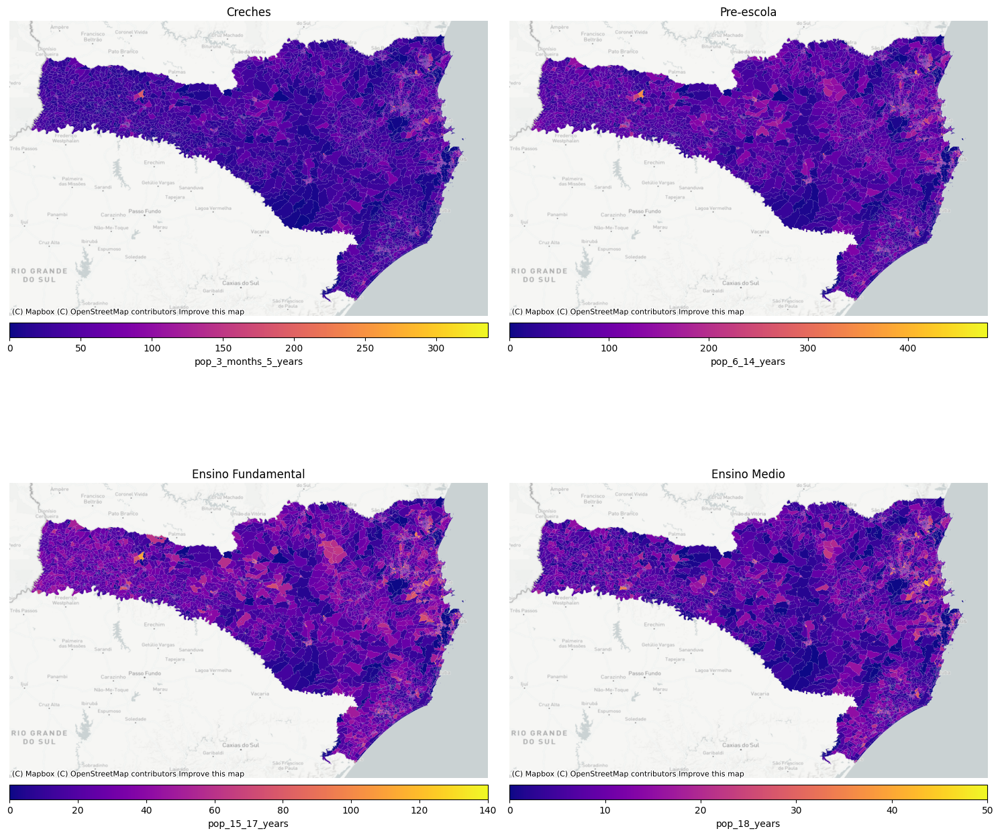

In [117]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

cols = [
    # "pop_3_months_3_years",
    # "pop_4_5_years",
    # "pop_6_10_years",
    # "pop_11_14_years",
    "pop_3_months_5_years",
    "pop_6_14_years",
    "pop_15_17_years",
    "pop_18_years",
]
titles = [
    "Creches",
    "Pre-escola",
    "Ensino Fundamental",
    "Ensino Medio",
    "Educação Profissional",
]

for ax, col, title in zip(axes.flatten(), cols, titles):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.1)
    cntr_income.plot(
        ax=ax,
        column=col,
        cmap="plasma",
        legend=True,
        legend_kwds={"label": col, "orientation": "horizontal"},
        missing_kwds={"color": "lightgrey"},
        cax=cax,
    )
    ax.set_title(title)
    ax.set_axis_off()
    cx.add_basemap(ax, crs=state.crs.to_string(), source=BASEMAP_WHITE)

plt.tight_layout()

plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/06-state_pop_by_edulevel.png",
    dpi=300,
    bbox_inches="tight",
)

### Step 2.2. Download Meta's High Resolution Population Density


Let's see all the available datasets for Brazil in Humanitarian Data Exchange (HDX).


In [118]:
brazil_hdx_datasets = up.download.search_hdx_dataset("brazil")
brazil_hdx_datasets

,created,name,population,size_mb,url
id,,,,,
0,2019-06-11,BRA_children_under_five_2019-06-01_csv.zip,Children (ages 0-5),159.14,https://data.humdata.org/dataset/c17003d1-47f4...
1,2019-06-11,BRA_elderly_60_plus_2019-06-01_csv.zip,Elderly (ages 60+),159.42,https://data.humdata.org/dataset/c17003d1-47f4...
2,2019-06-11,BRA_men_2019-06-01_csv.zip,Men,160.20,https://data.humdata.org/dataset/c17003d1-47f4...
26,2019-06-11,BRA_women_2019-06-01_csv.zip,Women,160.21,https://data.humdata.org/dataset/c17003d1-47f4...
27,2019-06-11,BRA_women_of_reproductive_age_15_49_2019-06-01...,Women of reproductive age (ages 15-49),160.03,https://data.humdata.org/dataset/c17003d1-47f4...
28,2019-06-11,BRA_youth_15_24_2019-06-01_csv.zip,Youth (ages 15-24),159.79,https://data.humdata.org/dataset/c17003d1-47f4...
33,2019-06-25,population_bra_northeast_2018-10-01.csv..zip,Overall population density,71.24,https://data.humdata.org/dataset/c17003d1-47f4...
34,2019-06-25,population_bra_northwest_2018-10-01.csv.zip,Overall population density,13.46,https://data.humdata.org/dataset/c17003d1-47f4...
35,2019-06-25,population_bra_southeast_2018-10-01.csv.zip,Overall population density,159.42,https://data.humdata.org/dataset/c17003d1-47f4...


We will download the **Overall population density** dataset from HDX. This dataset contains the population density of Brazil at 30m2 resolution.


In [38]:
pop_type = "Overall population density"  # This could be specified depending on the census population age group

In [39]:
%%time
if os.path.exists(f"outputs/data/{STATE_ABBREV}/pop_general.parquet"):
    pop_general = gpd.read_parquet(f"outputs/data/{STATE_ABBREV}/pop_general.parquet")
else:
    pop_general_brazil = up.download.get_hdx_dataset(
        resources_df=brazil_hdx_datasets,
        ids=brazil_hdx_datasets.query("population == @pop_type").index.tolist(),
    )
    pop_general = up.geom.filter_population(pop_general_brazil, state)
    pop_general.to_parquet(f"outputs/data/{STATE_ABBREV}/pop_general.parquet")

CPU times: user 2.25 s, sys: 443 ms, total: 2.69 s
Wall time: 2.72 s


The obtained dataset is simple and contains the following columns:


In [119]:
pop_general.head()

,latitude,longitude,population_2015,population_2020,geometry
341596,-29.354861,-50.989583,0.816287,0.842802,POINT (-50.98958 -29.35486)
341597,-29.354861,-50.988750,0.816287,0.842802,POINT (-50.98875 -29.35486)
341598,-29.354861,-50.987917,1.231887,1.271902,POINT (-50.98792 -29.35486)
341599,-29.354861,-50.987639,1.231887,1.271902,POINT (-50.98764 -29.35486)
341600,-29.354861,-50.975694,1.231887,1.271902,POINT (-50.97569 -29.35486)


In [120]:
print(f"Number population data points for {STATE_ABBREV}:", len(pop_general))

Number population data points for SC: 3738747


<Axes: >

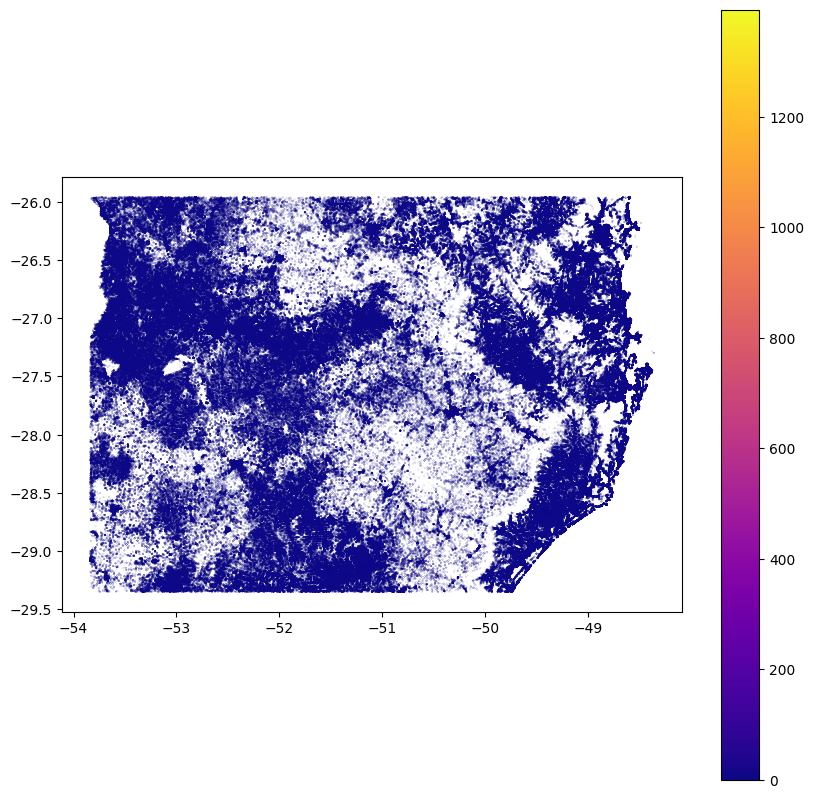

In [ ]:
pop_general.plot(
    column="population_2020",
    cmap="plasma",
    legend=True,
    figsize=(10, 10),
    markersize=0.001,
)

### Step 2.3. Aggregate Population Density in Hexagons (Uniform Spatial Units)


In [122]:
if os.path.exists(f"outputs/data/{STATE_ABBREV}/hexs.parquet"):
    hexs = gpd.read_parquet(f"outputs/data/{STATE_ABBREV}/hexs.parquet")
else:
    hexs = up.geom.gen_hexagons(resolution=8, city=state)
    hexs.to_parquet(f"outputs/data/{STATE_ABBREV}/hexs.parquet")

In [144]:
hexs

,hex,geometry
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4..."
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2..."
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2..."
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2..."
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2..."
...,...,...
141870,88a831d35dfffff,"POLYGON ((-48.48204 -26.18350, -48.47787 -26.1..."
141871,88a91bcd09fffff,"POLYGON ((-48.50489 -27.84191, -48.50072 -27.8..."
141872,88a91bcd51fffff,"POLYGON ((-48.52335 -27.84365, -48.51917 -27.8..."
141873,88a8357833fffff,"POLYGON ((-48.52251 -26.38642, -48.51834 -26.3..."


In [123]:
%%time
hexs_pop = up.geom.merge_shape_hex(
    hexs=hexs,
    shape=pop_general,
    agg={
        "population_2020": "sum",
    },
)

CPU times: user 2.06 s, sys: 412 ms, total: 2.47 s
Wall time: 2.62 s


In [145]:
hexs_pop

,hex,geometry,population_2020
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",NaN
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",NaN
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.000000
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",NaN
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",NaN
...,...,...,...
141870,88a831d35dfffff,"POLYGON ((-48.48204 -26.18350, -48.47787 -26.1...",7.058260
141871,88a91bcd09fffff,"POLYGON ((-48.50489 -27.84191, -48.50072 -27.8...",NaN
141872,88a91bcd51fffff,"POLYGON ((-48.52335 -27.84365, -48.51917 -27.8...",NaN
141873,88a8357833fffff,"POLYGON ((-48.52251 -26.38642, -48.51834 -26.3...",0.752872


In [124]:
# Check if there are duplicated hexagons
hexs_pop["hex"].duplicated().sum()

0

In [125]:
# Verify the integrity of the data size
hexs.shape, hexs_pop.shape

((141875, 2), (141875, 3))

### Step 2.4. Convert Census Tract Level Data to Hexagons Level

Census tract level numerical variables like population and income will be divided in hexagons proportionally to the Meta high-resolution population density.


In [126]:
# Verify crs are the same
hexs.crs.to_string(), cntr_income.crs.to_string()

('EPSG:4326', 'EPSG:4326')

In [127]:
# if not make them the same
if not hexs.crs.to_string() != cntr_income.crs.to_string():
    cntr_income = cntr_income.to_crs(hexs.crs)

In [48]:
# # Population divided in hexagons proportionally to the area of the census tracts (not interesting for this case)
# pop_hexs_pops_census = up.geom.overlay_polygons_hexs(
#     polygons=para_cntr_income,
#     hexs=para_hexs_pop,
#     hex_col="hex",
#     columns=["pop_3_5_years", "pop_6_14_years", "pop_15_17_years", "pop_18_years", "V002", "V003"],
# )

# pop_hexs_pops_census.head()

In [49]:
def proportional_overlay():
    # TODO: Use the code below to implement this function
    pass

In [146]:
hexs_pop.head()

,hex,geometry,population_2020
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",NaN
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",NaN
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.0
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",NaN
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",NaN


In [147]:
hexs_pop.isna().sum()

hex                    0
geometry               0
population_2020    59061
dtype: int64

In [148]:
hexs_pop_nonull = hexs_pop.fillna(0)

In [149]:
%%time
# Overlay intersection (this operation is time expensive ~2min)
overlayed = gpd.overlay(cntr_income, hexs_pop_nonull, how="intersection")

CPU times: user 7.12 s, sys: 312 ms, total: 7.43 s
Wall time: 7.56 s


In [ ]:
from h3 import h3

In [151]:
h3.h3_get_resolution(overlayed.iloc[0].hex)

8

Text(0.5, 1.0, 'Population between 3 months and 5 years old in Blumenau, SC')

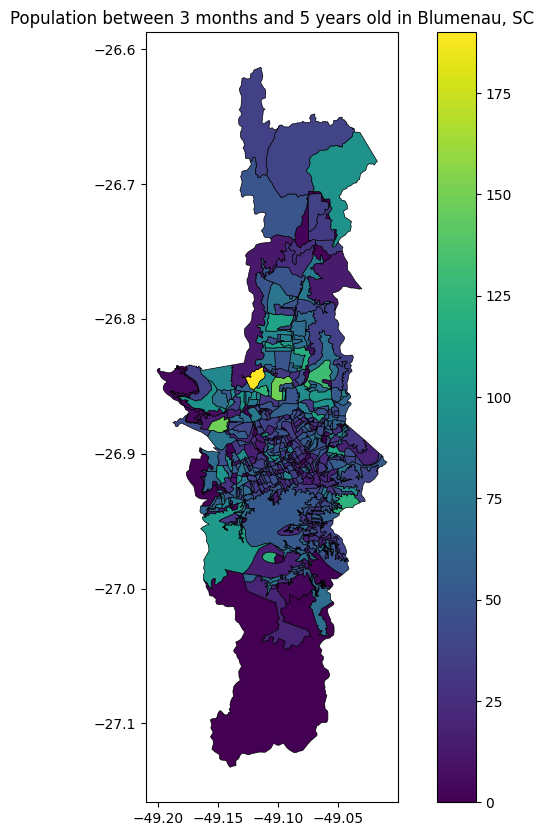

In [ ]:
muni_name = "Blumenau"
muni = cntr_income[cntr_income["name_muni"] == muni_name]
muni.plot(
    "pop_3_months_5_years",
    figsize=(10, 10),
    edgecolor="black",
    linewidth=0.5,
    legend=True,
)
plt.title(f"Population between 3 months and 5 years old in {muni_name}, {STATE_ABBREV}")

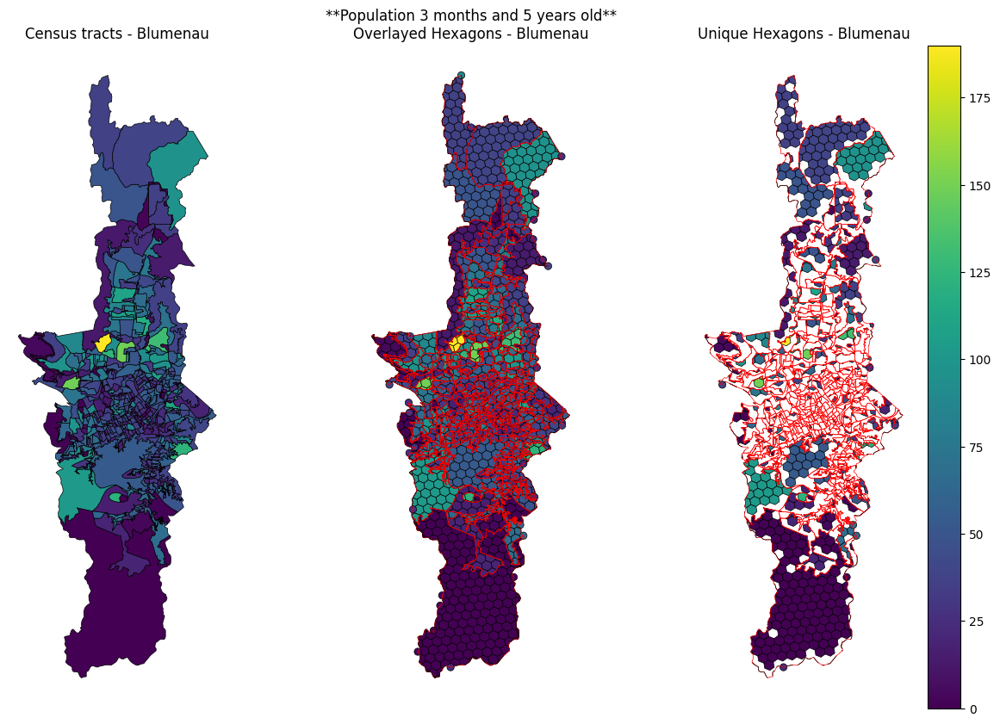

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 10))

# 1. Census tracts population
muni.plot(
    "pop_3_months_5_years", ax=axes[0], edgecolor="black", linewidth=0.5, legend=False
)
axes[0].set_title(f"Census tracts - {muni_name}")

# 2. Overlayed hexagons (all, clipped to muni)
overlayed.clip(muni).plot(
    "pop_3_months_5_years", ax=axes[1], edgecolor="black", linewidth=0.5, legend=False
)
muni.plot(ax=axes[1], facecolor="none", edgecolor="red", linewidth=0.5)
axes[1].set_title(
    f"**Population 3 months and 5 years old**\nOverlayed Hexagons - {muni_name}"
)

# 3. Overlayed hexagons (unique hex, clipped to muni)
overlayed.clip(muni).drop_duplicates("hex").plot(
    "pop_3_months_5_years", ax=axes[2], edgecolor="black", linewidth=0.5, legend=True
)
muni.plot(ax=axes[2], facecolor="none", edgecolor="red", linewidth=0.5)
axes[2].set_title(f"Unique Hexagons - {muni_name}")

for ax in axes:
    ax.set_axis_off()

# plt.tight_layout()
plt.show()

In [157]:
overlayed.head()

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,...,pop_6_10_years,pop_11_14_years,pop_15_17_years,pop_18_years,pop_3_5_years,pop_6_14_years,pop_3_months_5_years,hex,population_2020,geometry
0,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88a8356251fffff,42.030353,"POLYGON ((-48.70967 -26.39086, -48.71237 -26.3..."
1,420130705000001,URBANO,4201307.0,Araquari,Areias Pequenas,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,39.0,31.0,21.0,6.0,35.0,70.0,35.0,88a8356251fffff,42.030353,"POLYGON ((-48.71157 -26.38866, -48.70781 -26.3..."
2,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356251fffff,42.030353,"POLYGON ((-48.71157 -26.38866, -48.71299 -26.3..."
3,420130705000062,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88a8356251fffff,42.030353,"POLYGON ((-48.71237 -26.38990, -48.71299 -26.3..."
4,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88a83570b3fffff,2.086077,"POLYGON ((-48.71887 -26.40000, -48.71673 -26.3..."


In [158]:
cntr_income.shape, hexs_pop.shape, overlayed.shape

((12227, 56), (141875, 3), (229400, 58))

In [159]:
overlayed.head()

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,...,pop_6_10_years,pop_11_14_years,pop_15_17_years,pop_18_years,pop_3_5_years,pop_6_14_years,pop_3_months_5_years,hex,population_2020,geometry
0,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88a8356251fffff,42.030353,"POLYGON ((-48.70967 -26.39086, -48.71237 -26.3..."
1,420130705000001,URBANO,4201307.0,Araquari,Areias Pequenas,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,39.0,31.0,21.0,6.0,35.0,70.0,35.0,88a8356251fffff,42.030353,"POLYGON ((-48.71157 -26.38866, -48.70781 -26.3..."
2,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356251fffff,42.030353,"POLYGON ((-48.71157 -26.38866, -48.71299 -26.3..."
3,420130705000062,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88a8356251fffff,42.030353,"POLYGON ((-48.71237 -26.38990, -48.71299 -26.3..."
4,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88a83570b3fffff,2.086077,"POLYGON ((-48.71887 -26.40000, -48.71673 -26.3..."


In [160]:
# Downscaling helper functions
def min_max(x):
    return (x - x.min()) / (x.max() - x.min())


def downscale_proportionally(x, cols, prop_col):
    scaled_proportion = (x[prop_col] - x[prop_col].min()) / (
        x[prop_col].max() - x[prop_col].min()
    )
    downscaled_values = []
    for col in cols:
        # col_downscaled = x[col].unique()[0] * scaled_proportion
        col_downscaled = x[col] * scaled_proportion
        col_downscaled.name = col + "_adj"
        downscaled_values.append(col_downscaled)

    return pd.concat(downscaled_values, axis=1)

In [142]:
# Columns to process
cols = [
    # "pop_3_months_3_years",
    # "pop_4_5_years",
    # "pop_6_10_years",
    # "pop_11_14_years",
    "pop_3_months_5_years",
    "pop_6_14_years",
    "pop_15_17_years",
    "pop_18_years",
    "V002",  # Population
    "V003",  # Income (Reais R$)
]

In [162]:
overlayed[cols]

,pop_3_months_5_years,pop_6_14_years,pop_15_17_years,pop_18_years,V002,V003
0,0.0,0.0,0.0,0.0,NaN,NaN
1,35.0,70.0,21.0,6.0,353.0,177395.0
2,61.0,141.0,35.0,10.0,741.0,451561.0
3,0.0,0.0,0.0,0.0,NaN,NaN
4,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...
229395,48.0,88.0,39.0,9.0,653.0,531808.0
229396,48.0,88.0,39.0,9.0,653.0,531808.0
229397,48.0,88.0,39.0,9.0,653.0,531808.0
229398,48.0,88.0,39.0,9.0,653.0,531808.0


In [163]:
# Downsample census variables using proportional to Meta's population density
overlayed_scaled = overlayed.groupby("code_tract").progress_apply(
    downscale_proportionally,
    prop_col="population_2020",
    cols=cols,
)

  0%|          | 0/12213 [00:00<?, ?it/s]

In [164]:
overlayed.shape, overlayed_scaled.shape

((229400, 58), (229400, 6))

In [ ]:
CODE_TRACT_SAMPLE = 420130705000032  # Araquari district, Santa Catarina

In [170]:
overlayed[overlayed["code_tract"] == CODE_TRACT_SAMPLE]

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,...,pop_6_10_years,pop_11_14_years,pop_15_17_years,pop_18_years,pop_3_5_years,pop_6_14_years,pop_3_months_5_years,hex,population_2020,geometry
2,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356251fffff,42.030353,"POLYGON ((-48.71157 -26.38866, -48.71299 -26.3..."
9,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a83570b3fffff,2.086077,"POLYGON ((-48.71878 -26.39866, -48.71887 -26.4..."
14,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356259fffff,21.015176,"POLYGON ((-48.71677 -26.39237, -48.71675 -26.3..."
19635,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356257fffff,80.013804,"POLYGON ((-48.70791 -26.38301, -48.70798 -26.3..."
19669,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356219fffff,595.533571,"POLYGON ((-48.71405 -26.37678, -48.71674 -26.3..."
19685,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8356253fffff,378.639200,"POLYGON ((-48.71134 -26.37954, -48.71084 -26.3..."
19688,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a835752dfffff,447.629107,"POLYGON ((-48.72497 -26.38433, -48.72515 -26.3..."
19693,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8357525fffff,918.802245,"POLYGON ((-48.71689 -26.37505, -48.71674 -26.3..."
19698,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a8357565fffff,0.000000,"POLYGON ((-48.71782 -26.39667, -48.72003 -26.3..."
19709,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,70.0,71.0,35.0,10.0,61.0,141.0,61.0,88a835625bfffff,182.131529,"POLYGON ((-48.72245 -26.38937, -48.72249 -26.3..."


In [171]:
from shapely.geometry import Polygon

In [172]:
hexagon = gpd.GeoSeries(
    [
        Polygon(
            h3.h3_to_geo_boundary(
                overlayed[overlayed["code_tract"] == CODE_TRACT_SAMPLE]["hex"].iloc[0],
                geo_json=True,
            )
        )
    ]
)

In [173]:
CODE_TRACT_HEX_ID = overlayed[overlayed["code_tract"] == CODE_TRACT_SAMPLE]["hex"].iloc[
    0
]
CODE_TRACT_HEX_ID

'88a8356251fffff'

<Axes: >

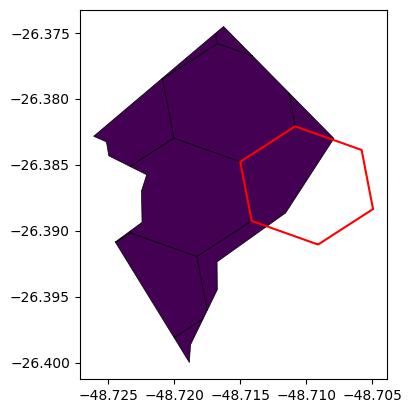

In [174]:
ax = overlayed[overlayed["code_tract"] == CODE_TRACT_SAMPLE].plot(
    "pop_11_14_years", edgecolor="black", linewidth=0.5
)
hexagon.boundary.plot(ax=ax, color="red")

<Axes: >

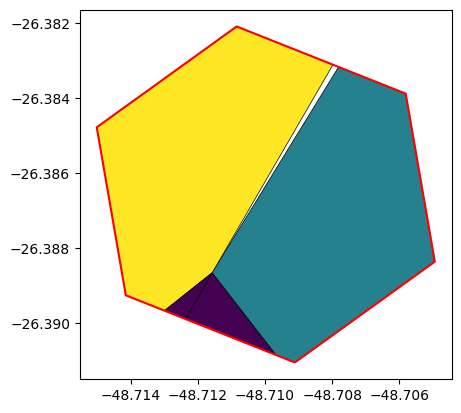

In [175]:
ax = hexagon.boundary.plot(color="red")
overlayed[overlayed["hex"] == CODE_TRACT_HEX_ID].plot(
    "pop_11_14_years", edgecolor="black", linewidth=0.5, ax=ax
)

In [176]:
# Check both GeoDataFrames have a common CRS
try:
    assert (
        cntr_income.crs.to_string() == hexs_pop_nonull.crs.to_string()
    ), f"CRS mismatch between cntr_income and hexs_pop_nonull: {cntr_income.crs.to_string()} != {hexs_pop_nonull.crs.to_string()}"
except AssertionError as e:
    print(e)
    # Handle CRS mismatch by reprojecting the census tracts to the hexagons CRS (4326)
    cntr_income = cntr_income.to_crs(hexs_pop_nonull.crs)

In [177]:
cntr_income.crs.to_string(), hexs_pop_nonull.crs.to_string()

('EPSG:4326', 'EPSG:4326')

In [178]:
hexs_pop_nonull

,hex,geometry,population_2020
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",0.000000
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",0.000000
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.000000
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",0.000000
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",0.000000
...,...,...,...
141870,88a831d35dfffff,"POLYGON ((-48.48204 -26.18350, -48.47787 -26.1...",7.058260
141871,88a91bcd09fffff,"POLYGON ((-48.50489 -27.84191, -48.50072 -27.8...",0.000000
141872,88a91bcd51fffff,"POLYGON ((-48.52335 -27.84365, -48.51917 -27.8...",0.000000
141873,88a8357833fffff,"POLYGON ((-48.52251 -26.38642, -48.51834 -26.3...",0.752872


<Axes: >

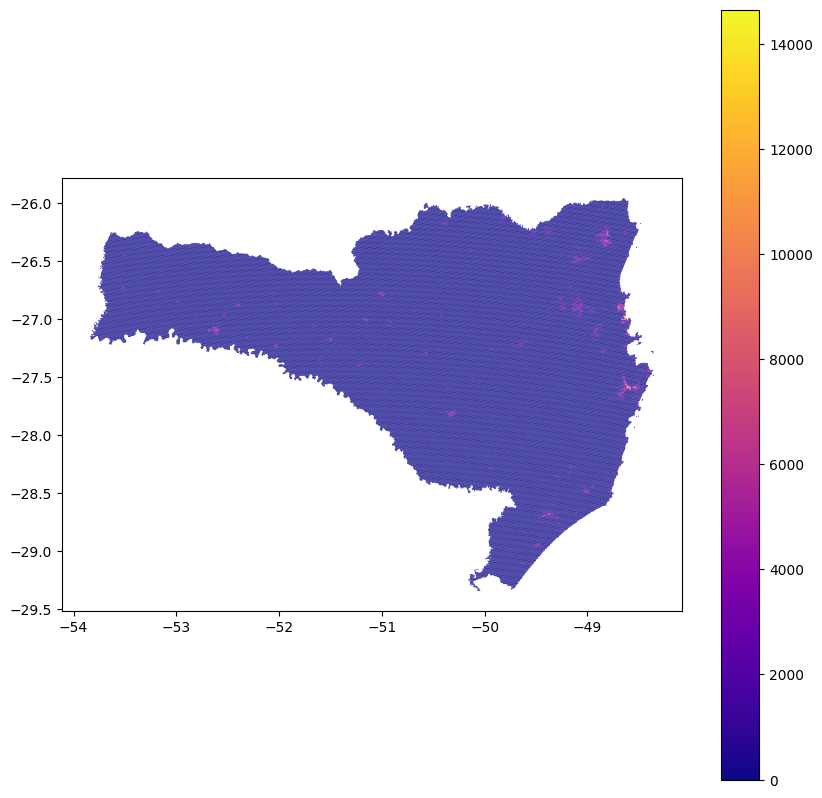

In [ ]:
hexs_pop_nonull.plot(
    "population_2020",
    cmap="plasma",
    legend=True,
    figsize=(10, 10),
    edgecolor="none",
    linewidth=0,
)

### THIS IS THE NEW PROCESS TO AGGRATE POPULATION DATA INTO HEXAGONS

this process is proporcional to the population density of the hexagons, not the census tracts

In [184]:
census_gdf = cntr_income
ancillary_gdf = hexs_pop_nonull

In [185]:
# Compute the area of each H3 hexagon (they are uniform, but we need the area for partial overlaps)
ancillary_gdf["hex_area"] = ancillary_gdf.geometry.area

In [186]:
# Compute the intersection between census tracts and H3 hexagons
intersection_gdf = gpd.overlay(census_gdf, ancillary_gdf, how="intersection")

In [187]:
# Calculate the area of each intersected polygon
intersection_gdf["intersect_area"] = intersection_gdf.geometry.area

In [188]:
# Calculate the fraction of each hexagon's area represented by the intersection
intersection_gdf["area_fraction"] = (
    intersection_gdf["intersect_area"] / intersection_gdf["hex_area"]
)

In [189]:
intersection_gdf["area_fraction"].describe().round(3)

count    229400.000
mean          0.617
std           0.395
min           0.000
25%           0.191
50%           0.759
75%           1.000
max           1.000
Name: area_fraction, dtype: float64

<Axes: >

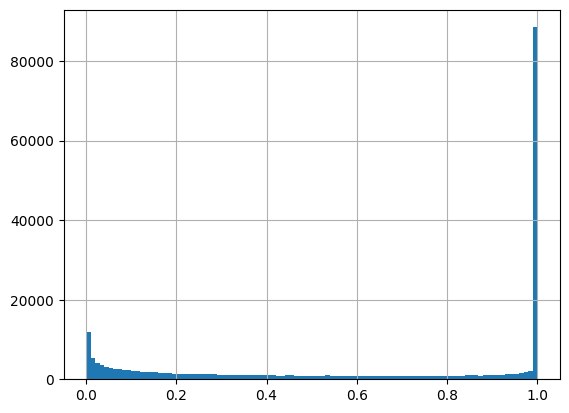

In [190]:
intersection_gdf["area_fraction"].hist(bins=100)

In [191]:
intersection_gdf.columns

Index(['code_tract', 'zone', 'code_muni', 'name_muni', 'name_neighborhood',
       'code_neighborhood', 'code_subdistrict', 'name_subdistrict',
       'code_district', 'name_district', 'code_state', 'V002', 'V003',
       'pessoa13_V021', 'pessoa13_V022', 'pessoa13_V023', 'pessoa13_V024',
       'pessoa13_V025', 'pessoa13_V026', 'pessoa13_V027', 'pessoa13_V028',
       'pessoa13_V029', 'pessoa13_V030', 'pessoa13_V031', 'pessoa13_V032',
       'pessoa13_V033', 'pessoa13_V034', 'pessoa13_V035', 'pessoa13_V036',
       'pessoa13_V037', 'pessoa13_V038', 'pessoa13_V039', 'pessoa13_V040',
       'pessoa13_V041', 'pessoa13_V042', 'pessoa13_V043', 'pessoa13_V044',
       'pessoa13_V045', 'pessoa13_V046', 'pessoa13_V047', 'pessoa13_V048',
       'pessoa13_V049', 'pessoa13_V050', 'pessoa13_V051', 'pessoa13_V052',
       'income_pc', 'pop_3_months_3_years', 'pop_4_5_years', 'pop_6_10_years',
       'pop_11_14_years', 'pop_15_17_years', 'pop_18_years', 'pop_3_5_years',
       'pop_6_14_years', 'po

In [193]:
intersection_gdf = intersection_gdf.rename(
    columns={
        "population_2020": "ancillary_population",  # High resolution population from Meta aggregated to H3 hexagons res 8
        # Census tract population by age groups
        "pop_3_months_3_years": "pop_3_months_3_years",
        "pop_4_5_years": "pop_4_5_years",
        "pop_6_10_years": "pop_6_10_years",
        "pop_11_14_years": "pop_11_14_years",
        "pop_6_14_years": "pop_6_14_years",
        "pop_15_17_years": "pop_15_17_years",
        "pop_18_years": "pop_18_years",
        "V002": "pop_total",  # Total population
        "V003": "income_total",  # Total income
    }
)

In [194]:
# Compute the weighted ancillary value for each intersection piece.
# This represents the portion of the hexagon's ancillary population in the intersected area.
intersection_gdf["weighted_ancillary"] = (
    intersection_gdf["ancillary_population"] * intersection_gdf["area_fraction"]
)

In [195]:
intersection_gdf.head()

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,...,pop_3_5_years,pop_6_14_years,pop_3_months_5_years,hex,ancillary_population,hex_area,geometry,intersect_area,area_fraction,weighted_ancillary
0,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.70967 -26.39086, -48.71237 -26.3...",2.049764e-06,0.032556,1.368328
1,420130705000001,URBANO,4201307.0,Araquari,Areias Pequenas,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,35.0,70.0,35.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.71157 -26.38866, -48.70781 -26.3...",3.050325e-05,0.484473,20.362570
2,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,61.0,141.0,61.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.71157 -26.38866, -48.71299 -26.3...",2.936396e-05,0.466378,19.602032
3,420130705000062,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.71237 -26.38990, -48.71299 -26.3...",4.750302e-07,0.007545,0.317108
4,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,0.0,0.0,88a83570b3fffff,2.086077,0.000063,"POLYGON ((-48.71887 -26.40000, -48.71673 -26.3...",5.692666e-06,0.090434,0.188653


In [196]:
# For each census tract, sum the weighted ancillary values (the total weight for that tract)
total_weights = (
    intersection_gdf.groupby("code_tract")["weighted_ancillary"].sum().reset_index()
)
total_weights = total_weights.rename(columns={"weighted_ancillary": "total_weight"})
intersection_gdf = intersection_gdf.merge(total_weights, on="code_tract", how="left")

In [197]:
# Calculate the proportion of the census tract's population that should be allocated to this piece
intersection_gdf["proportion"] = (
    intersection_gdf["weighted_ancillary"] / intersection_gdf["total_weight"]
)

In [198]:
intersection_gdf

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,...,pop_3_months_5_years,hex,ancillary_population,hex_area,geometry,intersect_area,area_fraction,weighted_ancillary,total_weight,proportion
0,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.70967 -26.39086, -48.71237 -26.3...",2.049764e-06,0.032556,1.368328,14.006922,0.097689
1,420130705000001,URBANO,4201307.0,Araquari,Areias Pequenas,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,35.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.71157 -26.38866, -48.70781 -26.3...",3.050325e-05,0.484473,20.362570,301.740848,0.067484
2,420130705000032,URBANO,4201307.0,Araquari,Centro,4.201307e+11,4.201307e+10,None,420130705.0,Araquari,...,61.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.71157 -26.38866, -48.71299 -26.3...",2.936396e-05,0.466378,19.602032,755.312833,0.025952
3,420130705000062,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,88a8356251fffff,42.030353,0.000063,"POLYGON ((-48.71237 -26.38990, -48.71299 -26.3...",4.750302e-07,0.007545,0.317108,4.332069,0.073200
4,420130705000046,RURAL,4201307.0,Araquari,None,NaN,4.201307e+10,None,420130705.0,Araquari,...,0.0,88a83570b3fffff,2.086077,0.000063,"POLYGON ((-48.71887 -26.40000, -48.71673 -26.3...",5.692666e-06,0.090434,0.188653,14.006922,0.013469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229395,421985305000004,RURAL,4219853.0,Zortéa,None,NaN,4.219853e+10,None,421985305.0,Zortéa,...,48.0,88a824a451fffff,1.992861,0.000061,"POLYGON ((-51.56329 -27.48650, -51.56413 -27.4...",6.083633e-05,1.000000,1.992861,1329.167153,0.001499
229396,421985305000004,RURAL,4219853.0,Zortéa,None,NaN,4.219853e+10,None,421985305.0,Zortéa,...,48.0,88a825db4dfffff,0.000000,0.000061,"POLYGON ((-51.49067 -27.40746, -51.49151 -27.4...",6.093609e-05,1.000000,0.000000,1329.167153,0.000000
229397,421985305000004,RURAL,4219853.0,Zortéa,None,NaN,4.219853e+10,None,421985305.0,Zortéa,...,48.0,88a824b4e7fffff,0.000000,0.000061,"POLYGON ((-51.55798 -27.57984, -51.55954 -27.5...",4.792033e-05,0.788661,0.000000,1329.167153,0.000000
229398,421985305000004,RURAL,4219853.0,Zortéa,None,NaN,4.219853e+10,None,421985305.0,Zortéa,...,48.0,88a824a42dfffff,0.664287,0.000061,"POLYGON ((-51.51453 -27.47620, -51.51536 -27.4...",6.086949e-05,1.000000,0.664287,1329.167153,0.000500


In [199]:
# Allocate the census tract's population to each intersection piece
processed_cols = [
    "pop_3_months_3_years",
    "pop_4_5_years",
    "pop_6_10_years",
    "pop_11_14_years",
    "pop_6_14_years",
    "pop_15_17_years",
    "pop_18_years",
    "pop_total",
    "income_total",
]
for col in processed_cols:
    intersection_gdf[f"{col}_adj"] = (
        intersection_gdf["proportion"] * intersection_gdf[col]
    )

In [200]:
# Finally, aggregate the allocated population for each H3 hexagon.
# This accounts for the possibility that a hexagon overlaps multiple census tracts.
hex_population = (
    intersection_gdf.groupby("hex")
    .agg({f"{col}_adj": "sum" for col in processed_cols})
    .reset_index()
)

In [201]:
hex_population

,hex,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj,pop_total_adj,income_total_adj
0,88a8200001fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,88a8200003fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,88a8200005fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,88a8200007fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,88a8200009fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
141867,88a956acd5fffff,0.391191,0.282526,0.912778,0.760648,1.673426,0.825847,0.130397,11.018533,5863.033276
141868,88a956acd7fffff,0.078238,0.056505,0.182556,0.152130,0.334685,0.165169,0.026079,2.203707,1172.606655
141869,88a956acd9fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
141870,88a956acdbfffff,0.782381,0.565053,1.825556,1.521297,3.346852,1.651693,0.260794,22.037067,11726.066552


In [202]:
ancillary_gdf.head()

,hex,geometry,population_2020,hex_area
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",0.0,0.000062
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",0.0,0.000062
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.0,0.000062
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",0.0,0.000062
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",0.0,0.000062


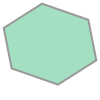

In [203]:
ancillary_gdf.iloc[0].geometry

<Axes: >

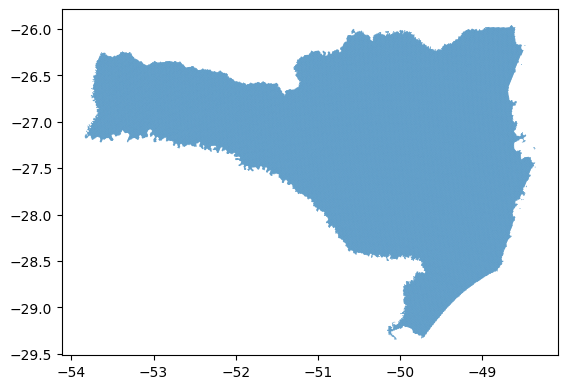

In [204]:
ancillary_gdf.plot()

In [205]:
ancillary_gdf.head()

,hex,geometry,population_2020,hex_area
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",0.0,0.000062
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",0.0,0.000062
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.0,0.000062
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",0.0,0.000062
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",0.0,0.000062


In [206]:
hex_population

,hex,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj,pop_total_adj,income_total_adj
0,88a8200001fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,88a8200003fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,88a8200005fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,88a8200007fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,88a8200009fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
141867,88a956acd5fffff,0.391191,0.282526,0.912778,0.760648,1.673426,0.825847,0.130397,11.018533,5863.033276
141868,88a956acd7fffff,0.078238,0.056505,0.182556,0.152130,0.334685,0.165169,0.026079,2.203707,1172.606655
141869,88a956acd9fffff,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
141870,88a956acdbfffff,0.782381,0.565053,1.825556,1.521297,3.346852,1.651693,0.260794,22.037067,11726.066552


In [207]:
hex_population.iloc[0]

hex                         88a8200001fffff
pop_3_months_3_years_adj                0.0
pop_4_5_years_adj                       0.0
pop_6_10_years_adj                      0.0
pop_11_14_years_adj                     0.0
pop_6_14_years_adj                      0.0
pop_15_17_years_adj                     0.0
pop_18_years_adj                        0.0
pop_total_adj                           0.0
income_total_adj                        0.0
Name: 0, dtype: object

In [208]:
# Merge the allocated population back into the original ancillary hexagons GeoDataFrame, if desired.
hexs_gdf = ancillary_gdf.merge(hex_population, on="hex", how="left")

In [209]:
hexs_gdf.head()

,hex,geometry,population_2020,hex_area,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj,pop_total_adj,income_total_adj
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [210]:
municipios.head()

,code_muni,name_muni,code_state,abbrev_state,name_state,code_region,name_region,geometry
0,4200051.0,Abdon Batista,42.0,SC,Santa Catarina,4.0,Sul,"MULTIPOLYGON (((-51.03917 -27.50758, -51.03412..."
1,4200101.0,Abelardo Luz,42.0,SC,Santa Catarina,4.0,Sul,"MULTIPOLYGON (((-52.37869 -26.43962, -52.37617..."
2,4200200.0,Agrolândia,42.0,SC,Santa Catarina,4.0,Sul,"MULTIPOLYGON (((-49.83288 -27.34884, -49.83138..."
3,4200309.0,Agronômica,42.0,SC,Santa Catarina,4.0,Sul,"MULTIPOLYGON (((-49.69336 -27.24585, -49.69943..."
4,4200408.0,Água Doce,42.0,SC,Santa Catarina,4.0,Sul,"MULTIPOLYGON (((-51.63844 -26.58132, -51.63099..."


<Axes: >

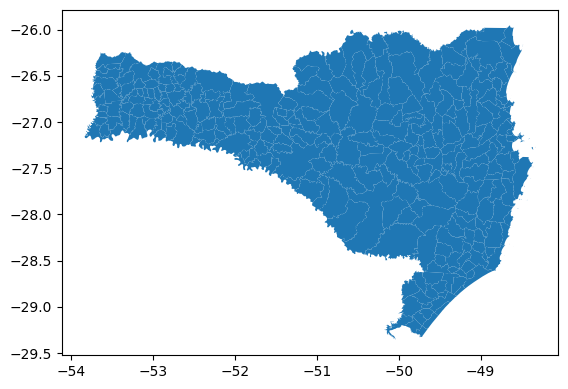

In [211]:
municipios.plot()

In [212]:
hexs_gdf_merged = hexs_gdf.sjoin(
    municipios[["geometry", "code_muni", "name_muni"]], how="left", op="intersects"
).drop_duplicates("hex")

In [213]:
hexs_gdf_merged.shape, hexs_gdf.shape

((141875, 16), (141875, 13))

In [214]:
hexs_gdf_merged.head()

,hex,geometry,population_2020,hex_area,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj,pop_total_adj,income_total_adj,index_right,code_muni,name_muni
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87,4205407.0,Florianópolis
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87,4205407.0,Florianópolis
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87,4205407.0,Florianópolis
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87,4205407.0,Florianópolis
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",0.0,0.000062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87,4205407.0,Florianópolis


In [236]:
print("Number of unique municipalities:", hexs_gdf_merged["code_muni"].nunique())
print("Number of missing municipalities:", hexs_gdf_merged["code_muni"].isna().sum())

Number of unique municipalities: 295
Number of missing municipalities: 0


In [237]:
cntr_income.groupby("code_muni").agg(
    {f"{col}": "sum" for col in processed_cols[:-2]}
).sort_index(ascending=False)

,pop_3_months_3_years,pop_4_5_years,pop_6_10_years,pop_11_14_years,pop_6_14_years,pop_15_17_years,pop_18_years
code_muni,,,,,,,
4219853.0,154.0,101.0,257.0,185.0,442.0,172.0,44.0
4219705.0,1259.0,688.0,1878.0,1729.0,3607.0,1322.0,478.0
4219606.0,168.0,99.0,256.0,236.0,492.0,208.0,59.0
4219507.0,2195.0,1225.0,3246.0,2973.0,6219.0,2324.0,724.0
4219408.0,167.0,102.0,265.0,267.0,532.0,212.0,55.0
...,...,...,...,...,...,...,...
4200408.0,365.0,247.0,594.0,556.0,1150.0,412.0,113.0
4200309.0,249.0,147.0,365.0,326.0,691.0,278.0,79.0
4200200.0,479.0,311.0,672.0,592.0,1264.0,470.0,172.0


In [238]:
hexs_gdf_merged

,hex,geometry,population_2020,hex_area,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj,pop_total_adj,income_total_adj,index_right,code_muni,name_muni
0,88a91b4d57fffff,"POLYGON ((-48.35799 -27.49173, -48.35381 -27.4...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
1,88a834b5a3fffff,"POLYGON ((-48.36029 -27.28936, -48.35611 -27.2...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
2,88a834b5b1fffff,"POLYGON ((-48.37543 -27.28406, -48.37125 -27.2...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
3,88a834b5b5fffff,"POLYGON ((-48.36620 -27.28317, -48.36203 -27.2...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
4,88a834b5abfffff,"POLYGON ((-48.36359 -27.29644, -48.35942 -27.2...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141870,88a831d35dfffff,"POLYGON ((-48.48204 -26.18350, -48.47787 -26.1...",7.058260,0.000063,0.080647,0.026882,0.168015,0.127692,0.295707,0.107530,0.026882,2.002744,1552.240729,242,4216206.0,São Francisco Do Sul
141871,88a91bcd09fffff,"POLYGON ((-48.50489 -27.84191, -48.50072 -27.8...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
141872,88a91bcd51fffff,"POLYGON ((-48.52335 -27.84365, -48.51917 -27.8...",0.000000,0.000062,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87,4205407.0,Florianópolis
141873,88a8357833fffff,"POLYGON ((-48.52251 -26.38642, -48.51834 -26.3...",0.752872,0.000063,0.001224,0.000000,0.002449,0.001224,0.003673,0.000612,0.000000,0.062440,47.916735,242,4216206.0,São Francisco Do Sul


In [239]:
hexs_gdf_merged.groupby("code_muni").agg(
    {f"{col}_adj": "sum" for col in processed_cols[:-2]}
)

,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj
code_muni,,,,,,,
4200051.0,112.390673,74.367290,181.192456,167.517734,348.710190,136.903261,34.156056
4200101.0,953.694910,535.598803,1622.179863,1488.256456,3110.436319,1026.464826,252.112070
4200200.0,486.815183,316.443865,688.949524,609.061247,1298.010771,483.317437,176.774725
4200309.0,332.773635,203.525422,487.027856,429.705409,916.733264,369.758629,108.063162
4200408.0,351.485090,239.850261,568.267325,530.991498,1099.258824,399.223965,111.657671
...,...,...,...,...,...,...,...
4219507.0,2199.079112,1228.210136,3252.810973,2982.442971,6235.253945,2330.463492,725.116739
4219606.0,169.463281,98.618271,256.576905,238.883966,495.460872,207.165522,57.543120
4219705.0,1254.386329,681.727878,1871.059219,1723.646284,3594.705503,1316.641057,477.353905


In [240]:
pop_per_muni_censo = (
    cntr_income.groupby("code_muni")
    .agg({f"{col}": "sum" for col in processed_cols[:-2]})
    .sort_index(ascending=False)
)
pop_per_muni_censo

,pop_3_months_3_years,pop_4_5_years,pop_6_10_years,pop_11_14_years,pop_6_14_years,pop_15_17_years,pop_18_years
code_muni,,,,,,,
4219853.0,154.0,101.0,257.0,185.0,442.0,172.0,44.0
4219705.0,1259.0,688.0,1878.0,1729.0,3607.0,1322.0,478.0
4219606.0,168.0,99.0,256.0,236.0,492.0,208.0,59.0
4219507.0,2195.0,1225.0,3246.0,2973.0,6219.0,2324.0,724.0
4219408.0,167.0,102.0,265.0,267.0,532.0,212.0,55.0
...,...,...,...,...,...,...,...
4200408.0,365.0,247.0,594.0,556.0,1150.0,412.0,113.0
4200309.0,249.0,147.0,365.0,326.0,691.0,278.0,79.0
4200200.0,479.0,311.0,672.0,592.0,1264.0,470.0,172.0


In [241]:
pop_per_muni_censo.index.unique().shape, pop_per_muni_censo.shape[0]

((293,), 293)

In [ ]:
pop_per_muni_hexs = (
    hexs_gdf_merged.groupby("code_muni")
    .agg({f"{col}_adj": "sum" for col in processed_cols[:-2]})
    .loc[pop_per_muni_censo.index]
)
pop_per_muni_hexs

,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj
code_muni,,,,,,,
4219853.0,162.492732,106.267242,271.757141,196.861906,468.619047,180.976952,46.668189
4219705.0,1254.386329,681.727878,1871.059219,1723.646284,3594.705503,1316.641057,477.353905
4219606.0,169.463281,98.618271,256.576905,238.883966,495.460872,207.165522,57.543120
4219507.0,2199.079112,1228.210136,3252.810973,2982.442971,6235.253945,2330.463492,725.116739
4219408.0,153.439279,95.773116,247.206482,250.839316,498.045798,196.319754,51.845914
...,...,...,...,...,...,...,...
4200408.0,351.485090,239.850261,568.267325,530.991498,1099.258824,399.223965,111.657671
4200309.0,332.773635,203.525422,487.027856,429.705409,916.733264,369.758629,108.063162
4200200.0,486.815183,316.443865,688.949524,609.061247,1298.010771,483.317437,176.774725


In [243]:
pop_per_muni_hexs.index.unique().shape, pop_per_muni_hexs.shape[0]

((293,), 293)

In [244]:
pop_per_muni_censo = pop_per_muni_censo.merge(
    municipios[["code_muni", "name_muni"]], on="code_muni"
).set_index("name_muni")
pop_per_muni_censo.head()

,code_muni,pop_3_months_3_years,pop_4_5_years,pop_6_10_years,pop_11_14_years,pop_6_14_years,pop_15_17_years,pop_18_years
name_muni,,,,,,,,
Zortéa,4219853.0,154.0,101.0,257.0,185.0,442.0,172.0,44.0
Xaxim,4219705.0,1259.0,688.0,1878.0,1729.0,3607.0,1322.0,478.0
Xavantina,4219606.0,168.0,99.0,256.0,236.0,492.0,208.0,59.0
Xanxerê,4219507.0,2195.0,1225.0,3246.0,2973.0,6219.0,2324.0,724.0
Witmarsum,4219408.0,167.0,102.0,265.0,267.0,532.0,212.0,55.0


In [245]:
pop_per_muni_hexs = pop_per_muni_hexs.merge(
    municipios[["code_muni", "name_muni"]], on="code_muni"
).set_index("name_muni")
pop_per_muni_hexs.head()

,code_muni,pop_3_months_3_years_adj,pop_4_5_years_adj,pop_6_10_years_adj,pop_11_14_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj
name_muni,,,,,,,,
Zortéa,4219853.0,162.492732,106.267242,271.757141,196.861906,468.619047,180.976952,46.668189
Xaxim,4219705.0,1254.386329,681.727878,1871.059219,1723.646284,3594.705503,1316.641057,477.353905
Xavantina,4219606.0,169.463281,98.618271,256.576905,238.883966,495.460872,207.165522,57.543120
Xanxerê,4219507.0,2199.079112,1228.210136,3252.810973,2982.442971,6235.253945,2330.463492,725.116739
Witmarsum,4219408.0,153.439279,95.773116,247.206482,250.839316,498.045798,196.319754,51.845914


In [246]:
pop_per_muni_censo.shape[0], pop_per_muni_hexs.shape[0]

(293, 293)

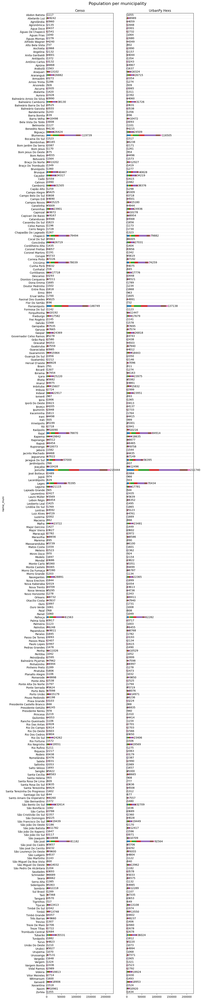

In [249]:
fig, axes = plt.subplots(1, 2, figsize=(20, 60), sharey=True)

pop_per_muni_censo.iloc[:, 1:].plot(
    kind="barh", figsize=(10, 60), title="Censo", stacked=True, ax=axes[0], legend=False
)
for i, v in enumerate(pop_per_muni_censo.iloc[:, 1:].sum(axis=1)):
    axes[0].text(v, i, f"{v:.0f}", va="center")

pop_per_muni_hexs.iloc[:, 1:].plot(
    kind="barh",
    figsize=(10, 60),
    title="UrbanPy Hexs",
    stacked=True,
    ax=axes[1],
    legend=False,
)
for i, v in enumerate(pop_per_muni_hexs.iloc[:, 1:].sum(axis=1)):
    axes[1].text(v, i, f"{v:.0f}", va="center")

# horizontal grid
axes[0].yaxis.grid(True, linestyle="--", alpha=0.5)
axes[1].yaxis.grid(True, linestyle="--", alpha=0.5)

fig.suptitle("Population per municipality", fontsize=16)
fig.subplots_adjust(top=0.97)

In [250]:
pop_comparison = pd.DataFrame(
    [
        pop_per_muni_censo.iloc[:, 1:].sum().values,
        pop_per_muni_hexs.iloc[:, 1:].sum().round().values,
    ]
).T
pop_comparison.columns = ["Censo", "UrbanPy Hexs"]
pop_comparison["Diff"] = pop_comparison["Censo"] - pop_comparison["UrbanPy Hexs"]
pop_comparison["Diff (%)"] = (
    (pop_comparison["Diff"] / pop_comparison["Censo"]) * 100
).round(2)
pop_comparison.index = pop_per_muni_censo.columns[1:]
pop_comparison

,Censo,UrbanPy Hexs,Diff,Diff (%)
pop_3_months_3_years,298419.0,297387.0,1032.0,0.35
pop_4_5_years,169987.0,169397.0,590.0,0.35
pop_6_10_years,451727.0,450063.0,1664.0,0.37
pop_11_14_years,413665.0,412211.0,1454.0,0.35
pop_6_14_years,865392.0,862274.0,3118.0,0.36
pop_15_17_years,324333.0,323204.0,1129.0,0.35
pop_18_years,107766.0,107372.0,394.0,0.37


In [251]:
print("Total population in Censo:", pop_per_muni_censo.iloc[:, 1:].sum().sum())
print(
    "Total population in UrbanPy Hexs:",
    pop_per_muni_hexs.iloc[:, 1:].sum().sum().round(),
)
print("Difference:", pop_comparison["Diff"].sum())
print("Difference (%):", pop_comparison["Diff (%)"].sum())

Total population in Censo: 2631289.0
Total population in UrbanPy Hexs: 2621910.0
Difference: 9381.0
Difference (%): 2.5


Compare the total number of census tracts and hexagons in Pará


In [252]:
print(
    "Census Tracts:",
    cntr_income.shape[0],
    "-->",
    "Hexagons:",
    hexs_gdf_merged.shape[0],
)

Census Tracts: 12227 --> Hexagons: 141875


In [253]:
# Sum of population columns in para_cntr_income
cntr_income_population_sum = cntr_income[
    [
        "pop_3_months_3_years",
        "pop_4_5_years",
        "pop_6_10_years",
        "pop_11_14_years",
        "pop_15_17_years",
        "pop_18_years",
    ]
].sum()

# Sum of population columns in hex_gdf
hex_gdf_population_sum = (
    hexs_gdf_merged[
        [
            "pop_3_months_3_years_adj",
            "pop_4_5_years_adj",
            "pop_6_10_years_adj",
            "pop_11_14_years_adj",
            "pop_15_17_years_adj",
            "pop_18_years_adj",
        ]
    ]
    .sum()
    .round()
)

print("Sum of population columns in para_cntr_income:")
print(cntr_income_population_sum)

print("\nSum of population columns in hex_gdf:")
print(hex_gdf_population_sum)


print(
    "Sum of total population in cntr_income:",
    cntr_income_population_sum.sum(),
)
print("Sum of total population in hex_gdf:", hex_gdf_population_sum.sum())
print(
    "Difference in total population:",
    cntr_income_population_sum.sum() - hex_gdf_population_sum.sum(),
)


print(
    "% variance:",
    round(
        (hex_gdf_population_sum.sum() - cntr_income_population_sum.sum())
        / cntr_income_population_sum.sum()
        * 100,
        4,
    ),
)

Sum of population columns in para_cntr_income:
pop_3_months_3_years    298419.0
pop_4_5_years           169987.0
pop_6_10_years          451727.0
pop_11_14_years         413665.0
pop_15_17_years         324333.0
pop_18_years            107766.0
dtype: float64

Sum of population columns in hex_gdf:
pop_3_months_3_years_adj    298284.0
pop_4_5_years_adj           169910.0
pop_6_10_years_adj          451507.0
pop_11_14_years_adj         413476.0
pop_15_17_years_adj         324169.0
pop_18_years_adj            107714.0
dtype: float64
Sum of total population in cntr_income: 1765897.0
Sum of total population in hex_gdf: 1765060.0
Difference in total population: 837.0
% variance: -0.0474


### Step 2.5. Visualize downsampled population data in hexagons

Let's see how the population and income data looks like in the hexagons. Visualizing data side by side is a good way to see if the data is consistent.
We will work with the Belem Metropolitan Area (BMA) since it is the most populated area in Pará and it is the capital of the state.


In [ ]:
most_populated_munis = municipios

In [ ]:
hexs_gdf_merged

In [254]:
most_populated_munis = (
    hexs_gdf_merged.groupby("name_muni")["population_2020"]
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .index.tolist()
)
most_populated_munis

['Joinville',
 'Florianópolis',
 'Blumenau',
 'São José',
 'Itajaí',
 'Chapecó',
 'Criciúma',
 'Jaraguá Do Sul',
 'Palhoça',
 'Lages']

In [256]:
munis_to_plot = municipios[municipios["name_muni"].isin(most_populated_munis)]
munis_to_plot_codes = munis_to_plot["code_muni"].tolist()
munis_to_plot_census_tract = cntr_income.query("code_muni in @munis_to_plot_codes")

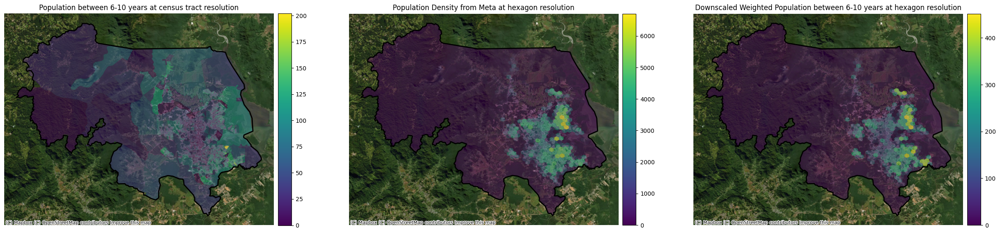

In [257]:
munis_to_plot = municipios[municipios["name_muni"].isin([most_populated_munis[0]])]
munis_to_plot_codes = munis_to_plot["code_muni"].tolist()
munis_to_plot_census_tract = cntr_income.query("code_muni in @munis_to_plot_codes")

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))

ax1.set_title("Population between 6-10 years at census tract resolution")
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
munis_to_plot_census_tract.plot(
    "pop_6_10_years", ax=ax1, alpha=0.5, legend=True, cax=cax
)
munis_to_plot.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax1)

ax2.set_title("Population Density from Meta at hexagon resolution")
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.1)
hexs_gdf_merged.clip(munis_to_plot.unary_union).plot(
    "population_2020", ax=ax2, alpha=0.5, legend=True, cax=cax
)
munis_to_plot.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax2)

ax3.set_title("Downscaled Weighted Population between 6-10 years at hexagon resolution")
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.1)
hexs_gdf_merged.clip(munis_to_plot.unary_union).plot(
    "pop_6_10_years_adj", ax=ax3, alpha=0.5, legend=True, cax=cax
)
munis_to_plot.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax3)

for ax in ax1, ax2, ax3:
    cx.add_basemap(ax, crs=munis_to_plot_census_tract.crs.to_string(), source=BASEMAP)
    ax.set_axis_off()

# plt.savefig(
#     "outputs/maps/para/07-para_downscaled_pop.png", dpi=300, bbox_inches="tight"
# )

Another way to check population consistency is to compare population distribution with road network density. The idea is that areas with higher population density should have more roads.


In [258]:
# download network from geometry
muni_income_g = ox.graph_from_polygon(munis_to_plot.unary_union, network_type="drive")

In [259]:
# Convert the graph to geodataframe
muni_income_gdf = ox.graph_to_gdfs(muni_income_g, nodes=False)

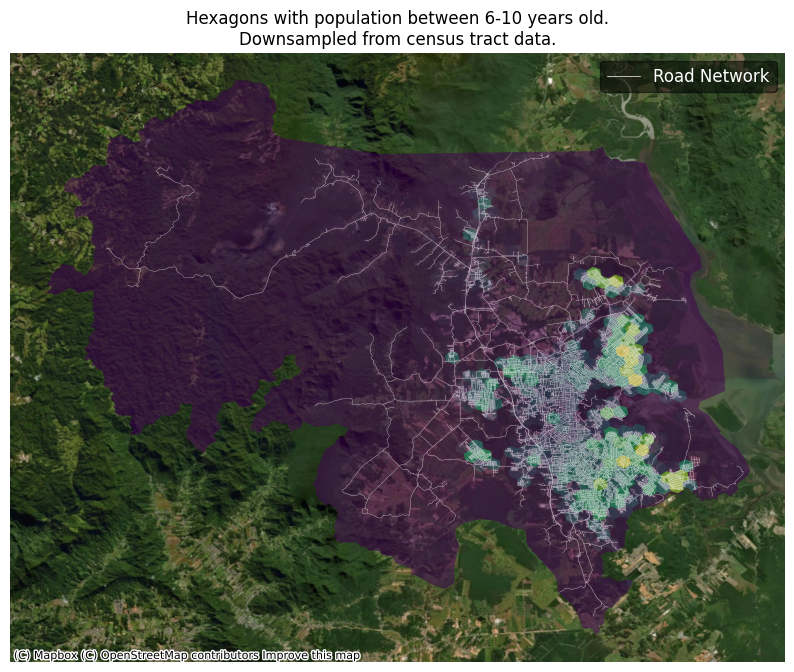

In [260]:
# plot the graph
fig, ax = plt.subplots(figsize=(10, 10))

# overlay the hexagons population
muni_income_gdf.plot(ax=ax, facecolor="none", edgecolor="white", linewidth=0.1)
hexs_gdf_merged.clip(munis_to_plot.unary_union).plot(
    "pop_6_10_years_adj", ax=ax, alpha=0.5, legend=True, cax=cax
)

# Create line2D objects with labels
legend_labels = ["Road Network"]
colors = ["white"]
linewidths = [0.5]
legend_handles = [
    plt.Line2D([0], [0], color=colors[0], linewidth=linewidths[0], linestyle="-")
]

# Set title and legend
ax.set_title(
    "Hexagons with population between 6-10 years old.\nDownsampled from census tract data."
)
# Make font color white
ax.legend(
    legend_handles,
    legend_labels,
    loc="upper right",
    framealpha=0.5,
    facecolor="black",
    edgecolor="black",
    fontsize=12,
)
# Make font color white
for text in ax.get_legend().get_texts():
    text.set_color("white")

# Add basemap
cx.add_basemap(ax, crs=hexs_gdf_merged.crs.to_string(), source=BASEMAP)
ax.set_axis_off()

# plt.savefig(
#     "outputs/maps/para/08-para_hexspop_roadnetwork.png", dpi=300, bbox_inches="tight"
# )

plt.show()

We can clearly observe that the population values mostly are located around the road network. This is a good sign that our downscaling method is working as expected. Also, higher population values correspond to higher density of roads.


### Step 2.6. Calculate and visualize income per capita


In [262]:
hexs_gdf_merged["income_pc"] = (
    hexs_gdf_merged["income_total_adj"] / hexs_gdf_merged["pop_total_adj"]
)

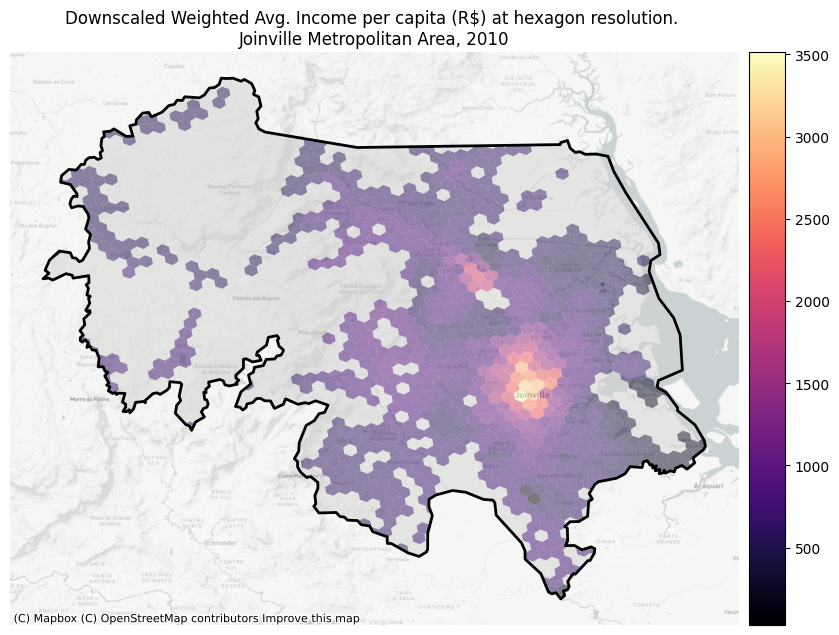

In [264]:
fig, ax = plt.subplots(figsize=(10, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

ax.set_title(
    "Downscaled Weighted Avg. Income per capita (R$) at hexagon resolution. \nJoinville Metropolitan Area, 2010"
)
hexs_gdf_merged.clip(munis_to_plot.unary_union).plot(
    "income_pc",
    ax=ax,
    cmap="magma",
    legend=True,
    alpha=0.5,
    missing_kwds={"color": "lightgrey", "alpha": 0.5},
    cax=cax,
)
munis_to_plot.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax)
ax.set_axis_off()

cx.add_basemap(ax, crs=hexs_gdf_merged.crs.to_string(), source=BASEMAP_WHITE)

## Step 3. Extract and process Schools geographical data


The school dataset is generated in the notebook [schools_data_extraction.ipynb](\schools_data_extraction.ipynb). In this notebook we use the `CensoBR` R package to download the schools data from the Brazilian Census. Then Schools Census data and Education metrics are merged to generate the final dataset.


In [266]:
# if os.path.exists("outputs/brazil_schools_census_edu_metrics.parquet"):
br_schools = gpd.read_parquet("../data/brazil_schools_census_education_metrics.parquet")

In [267]:
br_schools.crs.to_string(), "vs", hexs_gdf_merged.crs.to_string()

('EPSG:4674', 'vs', 'EPSG:4326')

In [268]:
# Convert Schools CRS to match hexagons
br_schools = br_schools.to_crs(hexs_gdf_merged.crs)

In [269]:
print("Number of schools in Brazil:", len(br_schools))

Number of schools in Brazil: 222936


In [270]:
br_schools.head()

,abbrev_state,name_muni,code_school,name_school,education_level,education_level_others,admin_category,address,phone_number,government_level,...,FUN_09_CAT_0,MULT_ETA_CAT_0,MED_CAT_0,MED_01_CAT_0,MED_02_CAT_0,MED_03_CAT_0,MED_04_CAT_0,MED_NS_CAT_0,lat,lon
0,RO,Porto Velho,11000023,EEEE ABNAEL MACHADO DE LIMA - CENE,Ensino Fundamental,Atendimento Educacional Especializado,Pública,"AVENIDA AMAZONAS, 6492 ZONA LESTE. TIRADENTES....",(69) 992083054,Estadual,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.758459,-63.854011
1,RO,Porto Velho,11000040,EMEIEF PEQUENOS TALENTOS,Educação Infantil,,Pública,"RUA CAETANO, 3256 PREDIO. CALADINHO. 76808-108...",(69) 32135237,Municipal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.793730,-63.883919
2,RO,Porto Velho,11000058,CENTRO DE ENSINO CLASSE A,"Educação Infantil, Ensino Fundamental, Ensino ...",,Privada,"AVENIDA CARLOS GOMES, 1135 CENTRO. 76801-123 P...",(69) 32244473,Privada,...,42.0,NaN,44.1,38.7,42.7,54.5,NaN,NaN,-8.760734,-63.901986
3,RO,Porto Velho,11000082,CENTRO EDUCACIONAL PRESBITERIANO 15 DE NOVEMBRO,"Educação Infantil, Ensino Fundamental",,Privada,"RUA ALMIRANTE BARROSO, 1483 SANTA BARBARA. 768...",(69) 32245636,Privada,...,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,-8.765205,-63.896177
4,RO,Porto Velho,11000104,CENTRO EDUC CORA CORALINA,"Educação Infantil, Ensino Fundamental",,Privada,"RUA MEXICO, 1056 NOVA PORTO VELHO. 76820-190 P...",(69) 32252616,Privada,...,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.768633,-63.875471


In [271]:
br_schools.columns[:20]

Index(['abbrev_state', 'name_muni', 'code_school', 'name_school',
       'education_level', 'education_level_others', 'admin_category',
       'address', 'phone_number', 'government_level', 'private_school_type',
       'private_government_partnership', 'regulated_education_council',
       'service_restriction', 'size', 'urban', 'location_type', 'date_update',
       'geometry', 'NO_ENTIDADE'],
      dtype='object')

In [272]:
(
    br_schools["admin_category"].unique(),
    br_schools["government_level"].unique(),
    br_schools["private_government_partnership"].unique(),
    br_schools["education_level"].unique(),
)

(array(['Pública', 'Privada'], dtype=object),
 array(['Estadual', 'Municipal', 'Privada', 'Federal'], dtype=object),
 array(['Não', 'Sim'], dtype=object),
 array(['Ensino Fundamental', 'Educação Infantil',
        'Educação Infantil, Ensino Fundamental, Ensino Médio',
        'Educação Infantil, Ensino Fundamental',
        'Ensino Fundamental, Ensino Médio', '',
        'Ensino Fundamental, Educação de Jovens Adultos',
        'Ensino Fundamental, Ensino Médio, Educação de Jovens Adultos',
        'Ensino Médio',
        'Educação Infantil, Ensino Fundamental, Ensino Médio, Educação Profissional',
        'Educação de Jovens Adultos',
        'Educação Infantil, Ensino Fundamental, Educação de Jovens Adultos',
        'Ensino Médio, Educação Profissional',
        'Educação Infantil, Ensino Fundamental, Ensino Médio, Educação de Jovens Adultos',
        'Ensino Fundamental, Ensino Médio, Educação Profissional',
        'Ensino Médio, Educação de Jovens Adultos',
        'Educação Prof

### Step 3.1. Aggregate categorical variables in hexagons

To work with categorical data we have to convert from text to numerical values. To do this we will create one column for each class in the caterogical variable and fill with 1 if the school belongs to that class and 0 otherwise. This process is known as One or Multi-hot encoding.


In [273]:
mlb_edu = MultiLabelBinarizer(
    classes=[
        "Ensino Fundamental",
        "Educação Infantil",
        "Ensino Médio",
        "Educação de Jovens Adultos",
        "Educação Profissional",
        "",
    ]
)
edu_level = pd.DataFrame(
    mlb_edu.fit_transform(br_schools["education_level"].str.split(", ")),
    columns=mlb_edu.classes_,
    index=br_schools.index,
)
edu_level.columns = [
    "ensino_fundamental",
    "educacao_infantil",
    "ensino_medio",
    "educacao_jovens_adultos",
    "educacao_profissional",
    "no_specified",
]

Example of education level columns assigned to the schools:


In [274]:
br_schools["education_level"].isna().sum()

0

In [275]:
br_schools["education_level"].loc[222931]

''

In [277]:
br_schools["education_level"].str.split(", ")

0                                      [Ensino Fundamental]
1                                       [Educação Infantil]
2         [Educação Infantil, Ensino Fundamental, Ensino...
3                   [Educação Infantil, Ensino Fundamental]
4                   [Educação Infantil, Ensino Fundamental]
                                ...                        
222931                                                   []
222932              [Educação Infantil, Ensino Fundamental]
222933                   [Ensino Fundamental, Ensino Médio]
222934                                                   []
222935                                                   []
Name: education_level, Length: 222936, dtype: object

In [278]:
edu_level.head()

,ensino_fundamental,educacao_infantil,ensino_medio,educacao_jovens_adultos,educacao_profissional,no_specified
0,1,0,0,0,0,0
1,0,1,0,0,0,0
2,1,1,1,0,0,0
3,1,1,0,0,0,0
4,1,1,0,0,0,0


In [279]:
edu_level.sum()

ensino_fundamental         126166
educacao_infantil          114851
ensino_medio                28860
educacao_jovens_adultos     29763
educacao_profissional        6123
no_specified                42377
dtype: int64

In [280]:
br_schools = br_schools.assign(**edu_level.to_dict())

In [281]:
br_schools["admin_category"].value_counts()

admin_category
Pública    171631
Privada     51305
Name: count, dtype: int64

In [282]:
br_schools["publica"] = br_schools["admin_category"].replace(
    {"Pública": 1, "Privada": 0}
)

In [283]:
br_schools["publica"].value_counts()

publica
1    171631
0     51305
Name: count, dtype: int64

Example of administrative category columns assigned to the schools:


In [284]:
br_schools["publica"].head()

0    1
1    1
2    0
3    0
4    0
Name: publica, dtype: int64

In [285]:
mlb_gov_level = LabelBinarizer()
gov_level = pd.DataFrame(
    mlb_gov_level.fit_transform(br_schools["government_level"]),
    columns=mlb_gov_level.classes_,
    index=br_schools.index,
)
gov_level.columns = gov_level.columns.str.lower()

Example of goverment level columns assigned to the schools:


In [286]:
gov_level.head()

,estadual,federal,municipal,privada
0,1,0,0,0
1,0,0,1,0
2,0,0,0,1
3,0,0,0,1
4,0,0,0,1


In [287]:
br_schools = br_schools.assign(**gov_level.to_dict())

In [294]:
STATE_ABBREV

'SC'

In [295]:
state_schools = br_schools.query(f"abbrev_state == '{STATE_ABBREV}'")

In [ ]:
state_schools.shape

(7213, 170)

In [297]:
# Verify integrity of code_school as unique identifier
state_schools.shape, state_schools["code_school"].unique().shape

((7213, 170), (7213,))

In [298]:
state_schools[
    [
        "code_school",
        "educacao_infantil",
        "educacao_jovens_adultos",
        "educacao_profissional",
        "ensino_fundamental",
        "ensino_medio",
        "no_specified",
        "publica",
    ]
]

,code_school,educacao_infantil,educacao_jovens_adultos,educacao_profissional,ensino_fundamental,ensino_medio,no_specified,publica
192628,42000017,0,0,1,1,1,0,1
192629,42000033,1,0,0,0,0,0,1
192630,42000041,1,0,0,0,0,0,0
192631,42000068,1,0,0,0,0,0,0
192632,42000106,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
199836,42360277,1,0,0,0,0,0,1
199837,42360285,1,0,0,0,0,0,1
199838,42360293,1,0,0,0,0,0,1
199839,42361265,0,1,0,0,0,0,0


In [299]:
# Count number of schools hexagon using urbanpy
hexs_and_schools_gdf = up.geom.merge_shape_hex(
    hexs=hexs_gdf_merged.drop(columns=["index_right"]),
    shape=state_schools,
    agg={
        # Education level
        "ensino_fundamental": "sum",
        "educacao_infantil": "sum",
        "ensino_medio": "sum",
        "educacao_jovens_adultos": "sum",
        "educacao_profissional": "sum",
        "no_specified": "sum",
        # Admin category
        "publica": "sum",
        "privada": "sum",
        # Government level
        "federal": "sum",
        "estadual": "sum",
        "municipal": "sum",
        # School count
        "code_school": "count",
    },
)

Once aggregated the categorical variables, we can visualize the number of schools per hexagon.
We will overlay the schools points to see if the aggregation is working as expected.


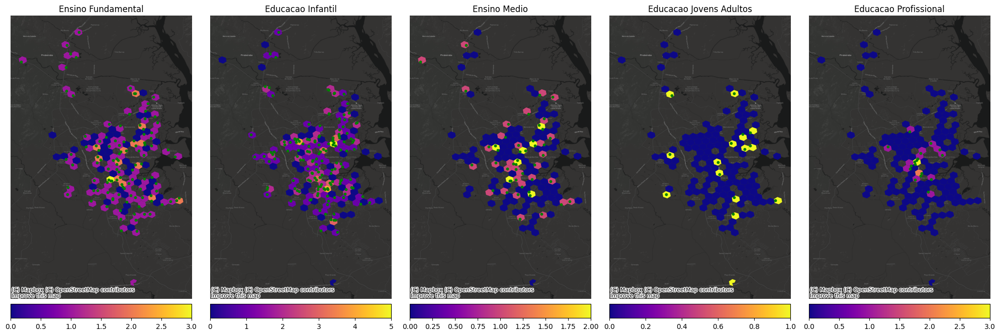

In [313]:
edu_levels = [
    "ensino_fundamental",
    "educacao_infantil",
    "ensino_medio",
    "educacao_jovens_adultos",
    "educacao_profissional",
]

fig, axes = plt.subplots(1, 5, figsize=(20, 8))

for ax, edu_level in zip(axes, edu_levels):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.1)
    ax.set_title(edu_level.replace("_", " ").title())
    hexs_and_schools_gdf.clip(munis_to_plot.geometry.iloc[0]).plot(
        edu_level,
        ax=ax,
        cmap="plasma",
        legend=True,
        cax=cax,
        legend_kwds={"orientation": "horizontal"},
    )
    state_schools.clip(munis_to_plot.geometry.iloc[0]).query(f"{edu_level} == 1").plot(
        color="green", ax=ax, markersize=10
    )
    ax.set_axis_off()
    cx.add_basemap(ax, crs=hexs_and_schools_gdf.crs.to_string(), source=BASEMAP_DARK)

# remove last plot
# axes[-1].remove()

plt.tight_layout()
plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/09-schools_hex.png", dpi=300, bbox_inches="tight"
)

Schools distribution seems to be consistent with the population distribution. This is a good sign that our aggregation method is working as expected.


### Step 3.2. Aggregate numerical variables in hexagons


Separate matriculas by education level to calculate the number of students per hexagon separting by education level and target student population.


In [314]:
state_schools.columns[-151:-13].tolist()

['NO_ENTIDADE',
 'CO_ENTIDADE_x',
 'TP_DEPENDENCIA',
 'TP_CATEGORIA_ESCOLA_PRIVADA',
 'TP_LOCALIZACAO',
 'TP_LOCALIZACAO_DIFERENCIADA',
 'QT_SALAS_UTILIZADAS_DENTRO',
 'QT_SALAS_UTILIZADAS_FORA',
 'QT_SALAS_UTILIZADAS',
 'QT_MAT_BAS_D',
 'QT_MAT_BAS_N',
 'QT_MAT_BAS_EAD',
 'QT_MAT_INF_INT',
 'QT_MAT_INF_CRE_INT',
 'QT_MAT_INF_PRE_INT',
 'QT_MAT_FUND_INT',
 'QT_MAT_FUND_AI_INT',
 'QT_MAT_FUND_AF_INT',
 'QT_MAT_MED_INT',
 'QT_MAT_BAS',
 'QT_MAT_INF',
 'QT_MAT_INF_CRE',
 'QT_MAT_INF_PRE',
 'QT_MAT_FUND',
 'QT_MAT_FUND_AI',
 'QT_MAT_FUND_AF',
 'QT_MAT_MED',
 'QT_MAT_PROF',
 'QT_MAT_PROF_TEC',
 'QT_MAT_EJA',
 'QT_MAT_EJA_FUND',
 'QT_MAT_EJA_MED',
 'QT_MAT_ESP',
 'QT_MAT_ESP_CC',
 'QT_MAT_ESP_CE',
 'QT_MAT_BAS_0_3',
 'QT_MAT_BAS_4_5',
 'QT_MAT_BAS_6_10',
 'QT_MAT_BAS_11_14',
 'QT_MAT_BAS_15_17',
 'QT_MAT_BAS_18_MAIS',
 'QT_DOC_BAS',
 'QT_DOC_INF',
 'QT_DOC_INF_CRE',
 'QT_DOC_INF_PRE',
 'QT_DOC_FUND',
 'QT_DOC_FUND_AI',
 'QT_DOC_FUND_AF',
 'QT_DOC_MED',
 'QT_DOC_PROF',
 'QT_DOC_PROF_TEC',
 'Q

In [315]:
state_schools[state_schools.columns[-145:-13]].head()

,QT_SALAS_UTILIZADAS_DENTRO,QT_SALAS_UTILIZADAS_FORA,QT_SALAS_UTILIZADAS,QT_MAT_BAS_D,QT_MAT_BAS_N,QT_MAT_BAS_EAD,QT_MAT_INF_INT,QT_MAT_INF_CRE_INT,QT_MAT_INF_PRE_INT,QT_MAT_FUND_INT,...,FUN_07_CAT_0,FUN_08_CAT_0,FUN_09_CAT_0,MULT_ETA_CAT_0,MED_CAT_0,MED_01_CAT_0,MED_02_CAT_0,MED_03_CAT_0,MED_04_CAT_0,MED_NS_CAT_0
192628,80.0,0.0,80.0,4599.0,354.0,0.0,0.0,0.0,0.0,387.0,...,30.2,31.8,34.8,NaN,34.5,37.6,32.4,35.2,19.5,NaN
192629,6.0,0.0,6.0,89.0,0.0,0.0,76.0,38.0,38.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192630,5.0,0.0,5.0,79.0,0.0,0.0,79.0,59.0,20.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192631,5.0,0.0,5.0,87.0,0.0,0.0,87.0,32.0,55.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192632,20.0,0.0,20.0,357.0,0.0,0.0,357.0,188.0,169.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [316]:
# Direct variables from the school census
classrooms_quantity_cols = [
    "QT_SALAS_UTILIZADAS_DENTRO",
    "QT_SALAS_UTILIZADAS_FORA",
    "QT_SALAS_UTILIZADAS",
]
students_quantity_cols = [
    ######## NEW VARIABLES ########
    "QT_MAT_BAS_D",  # Número de Matrículas na Educação Básica - Turno Diurno
    "QT_MAT_BAS_N",  # Número de Matrículas na Educação Básica - Turno Noturno
    "QT_MAT_BAS_EAD",  # Número de Matrículas na Educação Básica - Turmas semipresenciais ou de Educação a Distância (EAD)
    "QT_MAT_INF_INT",  # Número de Matrículas na Educação Infantil - Tempo Integral
    "QT_MAT_INF_CRE_INT",  # Número de Matrículas na Educação Infantil - Creche - Tempo Integral
    "QT_MAT_INF_PRE_INT",  # Número de Matrículas na Educação Infantil - Pré-Escola - Tempo Integral
    "QT_MAT_FUND_INT",  # Número de Matrículas no Ensino Fundamental - Tempo Integral
    "QT_MAT_FUND_AI_INT",  # Número de Matrículas no Ensino Fundamental - Anos Iniciais - Tempo Integral
    "QT_MAT_FUND_AF_INT",  # Número de Matrículas no Ensino Fundamental - Anos Finais - Tempo Integral
    "QT_MAT_MED_INT",  # Número de Matrículas no Ensino Médio - Tempo Integral
    ######## NEW VARIABLES ########
    "QT_MAT_BAS",
    "QT_MAT_INF",
    "QT_MAT_INF_CRE",
    "QT_MAT_INF_PRE",
    "QT_MAT_FUND",
    "QT_MAT_FUND_AI",
    "QT_MAT_FUND_AF",
    "QT_MAT_MED",
    "QT_MAT_PROF",
    "QT_MAT_PROF_TEC",
    "QT_MAT_EJA",
    "QT_MAT_EJA_FUND",
    "QT_MAT_EJA_MED",
    "QT_MAT_ESP",
    "QT_MAT_ESP_CC",
    "QT_MAT_ESP_CE",
    "QT_MAT_BAS_0_3",
    "QT_MAT_BAS_4_5",
    "QT_MAT_BAS_6_10",
    "QT_MAT_BAS_11_14",
    "QT_MAT_BAS_15_17",
    "QT_MAT_BAS_18_MAIS",
]
teachers_quantity_cols = [
    "QT_DOC_BAS",
    "QT_DOC_INF",
    "QT_DOC_INF_CRE",
    "QT_DOC_INF_PRE",
    "QT_DOC_FUND",
    "QT_DOC_FUND_AI",
    "QT_DOC_FUND_AF",
    "QT_DOC_MED",
    "QT_DOC_PROF",
    "QT_DOC_PROF_TEC",
    "QT_DOC_EJA",
    "QT_DOC_EJA_FUND",
    "QT_DOC_EJA_MED",
    "QT_DOC_ESP",
    "QT_DOC_ESP_CC",
    "QT_DOC_ESP_CE",
    "QT_TUR_BAS",
    "QT_TUR_INF",
    "QT_TUR_INF_CRE",
    "QT_TUR_INF_PRE",
    "QT_TUR_FUND",
    "QT_TUR_FUND_AI",
    "QT_TUR_FUND_AF",
    "QT_TUR_MED",
    "QT_TUR_PROF",
    "QT_TUR_PROF_TEC",
    "QT_TUR_EJA",
    "QT_TUR_EJA_FUND",
    "QT_TUR_EJA_MED",
    "QT_TUR_ESP",
    "QT_TUR_ESP_CC",
    "QT_TUR_ESP_CE",
]
# Calculated variables from the school census
ratio_students_per_teacher = [
    "ratio_MAT_DOC_BAS",
    "ratio_MAT_DOC_INF",
    "ratio_MAT_DOC_INF_CRE",
    "ratio_MAT_DOC_INF_PRE",
    "ratio_MAT_DOC_FUND",
    "ratio_MAT_DOC_FUND_AI",
    "ratio_MAT_DOC_FUND_AF",
    "ratio_MAT_DOC_MED",
    "ratio_MAT_DOC_PROF",
    "ratio_MAT_DOC_PROF_TEC",
    "ratio_MAT_DOC_EJA",
    "ratio_MAT_DOC_EJA_FUND",
    "ratio_MAT_DOC_EJA_MED",
    "ratio_MAT_DOC_ESP",
    "ratio_MAT_DOC_ESP_CC",
    "ratio_MAT_DOC_ESP_CE",
    "ratio_MAT_SALAS",
]
# Education metrics derived from the school census
teacher_effort_index_cols = [
    "FUN_CAT_1",
    "FUN_CAT_2",
    "FUN_CAT_3",
    "FUN_CAT_4",
    "FUN_CAT_5",
    "FUN_CAT_6",
    "FUN_AI_CAT_1",
    "FUN_AI_CAT_2",
    "FUN_AI_CAT_3",
    "FUN_AI_CAT_4",
    "FUN_AI_CAT_5",
    "FUN_AI_CAT_6",
    "FUN_AF_CAT_1",
    "FUN_AF_CAT_2",
    "FUN_AF_CAT_3",
    "FUN_AF_CAT_4",
    "FUN_AF_CAT_5",
    "FUN_AF_CAT_6",
]
student_per_course_cols = [
    "ED_INF_CAT_0",
    "CRE_CAT_0",
    "PRE_CAT_0",
    "FUN_CAT_0",
    "FUN_AI_CAT_0",
    "FUN_AF_CAT_0",
    "FUN_01_CAT_0",
    "FUN_02_CAT_0",
    "FUN_03_CAT_0",
    "FUN_04_CAT_0",
    "FUN_05_CAT_0",
    "FUN_06_CAT_0",
    "FUN_07_CAT_0",
    "FUN_08_CAT_0",
    "FUN_09_CAT_0",
    "MULT_ETA_CAT_0",
    "MED_CAT_0",
    "MED_01_CAT_0",
    "MED_02_CAT_0",
    "MED_03_CAT_0",
    "MED_04_CAT_0",
    "MED_NS_CAT_0",
]

In [317]:
print("Number of variables for classrooms_quantity", len(classrooms_quantity_cols))
print("Number of variables for students_quantity", len(students_quantity_cols))
print("Number of variables for teachers_quantity", len(teachers_quantity_cols))
print(
    "Number of variables for ratio_students_per_teacher",
    len(ratio_students_per_teacher),
)
print("Number of variables for teacher_effort_index", len(teacher_effort_index_cols))
print("Number of variables for student_per_course", len(student_per_course_cols))
print(
    "Total:",
    len(
        classrooms_quantity_cols
        + students_quantity_cols
        + teachers_quantity_cols
        + ratio_students_per_teacher
        + teacher_effort_index_cols
        + student_per_course_cols
    ),
)

Number of variables for classrooms_quantity 3
Number of variables for students_quantity 32
Number of variables for teachers_quantity 32
Number of variables for ratio_students_per_teacher 17
Number of variables for teacher_effort_index 18
Number of variables for student_per_course 22
Total: 124


In [318]:
# Aggregate matriculas by hexagon
hexs_and_schools_gdf = up.geom.merge_shape_hex(
    hexs=hexs_and_schools_gdf,
    shape=state_schools,
    agg={col: "sum" for col in classrooms_quantity_cols}
    | {col: "sum" for col in students_quantity_cols}
    | {col: "sum" for col in teachers_quantity_cols}
    | {col: "mean" for col in ratio_students_per_teacher}
    | {col: "mean" for col in teacher_effort_index_cols}
    | {col: "mean" for col in student_per_course_cols},
)

In [319]:
hexs_and_schools_gdf_students_avg = up.geom.merge_shape_hex(
    hexs=hexs_and_schools_gdf.drop(
        classrooms_quantity_cols + students_quantity_cols + teachers_quantity_cols,
        axis=1,
    ),
    shape=br_schools,
    agg={col: "mean" for col in classrooms_quantity_cols}
    | {col: "mean" for col in students_quantity_cols}
    | {col: "mean" for col in teachers_quantity_cols},
)

In [320]:
# Add "AVG_" prefix to columns aggregated by mean
hexs_and_schools_gdf_students_avg.columns = [
    "AVG_" + col for col in hexs_and_schools_gdf_students_avg.columns
]

##### NEW VARIABLES FOR PRIVATE SCHOOL


In [321]:
state_schools["admin_category"].value_counts()

admin_category
Pública    5716
Privada    1497
Name: count, dtype: int64

In [322]:
state_schools_private = state_schools[state_schools["admin_category"] == "Privada"]

In [323]:
print("Private schools in Pará:", len(state_schools))
print(
    "% of private schools in Pará:",
    round(100 * len(state_schools_private) / len(state_schools), 2),
)

Private schools in Pará: 7213
% of private schools in Pará: 20.75


In [324]:
state_schools_private[
    [
        "QT_MAT_INF_CRE",
        "QT_MAT_INF_PRE",
        "QT_MAT_FUND_AI",
        "QT_MAT_FUND_AF",
        "QT_MAT_MED",
    ]
].fillna(0)

,QT_MAT_INF_CRE,QT_MAT_INF_PRE,QT_MAT_FUND_AI,QT_MAT_FUND_AF,QT_MAT_MED
192630,59.0,20.0,0.0,0.0,0.0
192631,32.0,55.0,0.0,0.0,0.0
192632,188.0,169.0,0.0,0.0,0.0
192635,48.0,78.0,320.0,333.0,244.0
192636,13.0,71.0,376.0,280.0,156.0
...,...,...,...,...,...
199784,0.0,0.0,0.0,0.0,0.0
199790,0.0,0.0,0.0,0.0,0.0
199791,0.0,0.0,0.0,0.0,0.0
199834,76.0,122.0,502.0,320.0,168.0


In [325]:
state_schools_private.geometry, type(state_schools_private)

(192630    POINT (-48.58053 -27.60000)
 192631    POINT (-48.53671 -27.59233)
 192632    POINT (-48.54570 -27.59345)
 192635    POINT (-48.54670 -27.59462)
 192636    POINT (-48.54738 -27.59381)
                      ...             
 199784                    POINT EMPTY
 199790    POINT (-50.67223 -26.62075)
 199791    POINT (-51.74390 -27.00626)
 199834    POINT (-48.63920 -26.99284)
 199839    POINT (-52.40764 -26.87299)
 Name: geometry, Length: 1497, dtype: geometry,
 geopandas.geodataframe.GeoDataFrame)

In [326]:
######## NEW VARIABLES - PRIVATE ########
state_schools_private_students_qty = state_schools_private[
    [
        "QT_MAT_INF_CRE",
        "QT_MAT_INF_PRE",
        "QT_MAT_FUND_AI",
        "QT_MAT_FUND_AF",
        "QT_MAT_MED",
        "geometry",
    ]
]
private_students_qty_cols = [
    "PRIVATE_" + col for col in state_schools_private_students_qty.columns[:-1]
]
state_schools_private_students_qty.columns = private_students_qty_cols + ["geometry"]
######## NEW VARIABLES - PRIVATE ########

In [327]:
state_schools_private_students_qty.geometry, type(state_schools_private_students_qty)

(192630    POINT (-48.58053 -27.60000)
 192631    POINT (-48.53671 -27.59233)
 192632    POINT (-48.54570 -27.59345)
 192635    POINT (-48.54670 -27.59462)
 192636    POINT (-48.54738 -27.59381)
                      ...             
 199784                    POINT EMPTY
 199790    POINT (-50.67223 -26.62075)
 199791    POINT (-51.74390 -27.00626)
 199834    POINT (-48.63920 -26.99284)
 199839    POINT (-52.40764 -26.87299)
 Name: geometry, Length: 1497, dtype: geometry,
 geopandas.geodataframe.GeoDataFrame)

In [328]:
# Aggregate matriculas by hexagon
hexs_and_schools_gdf = up.geom.merge_shape_hex(
    hexs=hexs_and_schools_gdf,
    shape=state_schools_private_students_qty,
    agg={col: "sum" for col in private_students_qty_cols},
)

In [329]:
hexs_and_schools_gdf.shape

(141875, 157)

In [330]:
hexs_and_schools_gdf_students_avg.shape

(141875, 152)

In [331]:
hex_gdf = pd.concat(
    [
        hexs_and_schools_gdf,
        hexs_and_schools_gdf_students_avg[
            hexs_and_schools_gdf_students_avg.columns[
                -len(
                    classrooms_quantity_cols
                    + students_quantity_cols
                    + teachers_quantity_cols
                ) :
            ]
        ],
    ],
    axis=1,
)

## Step 4. Assing the hexagon zone (rural or urban)


We will use the census track variable to determine the urban area of Pará.


In [332]:
urban_area = geobr.read_urban_area(year=2015)

In [334]:
state_urban_area = urban_area.clip(state.geometry.iloc[0])

In [335]:
state_urban_area = urban_area.to_crs(hex_gdf.crs)

In [346]:
if not isinstance(state_urban_area, gpd.GeoDataFrame):
    state_urban_area_gdf = gpd.GeoDataFrame(
        geometry=[state_urban_area.unary_union], crs=state_urban_area.crs
    )
else:
    state_urban_area_gdf = state_urban_area

In [349]:
# Generate hexagons using urban area as boundary
urban_area_hex = up.geom.gen_hexagons(resolution=8, city=state_urban_area_gdf)
urban_area_idx = urban_area_hex["hex"].unique().tolist()

In [350]:
# Create urban_area column in hex
hex_gdf["urban_area"] = 0
# Assign 1 to hexagons that area in the urban area
hex_gdf.loc[hex_gdf["hex"].isin(urban_area_idx), "urban_area"] = 1

In [351]:
munis_to_plot

,code_muni,name_muni,code_state,abbrev_state,name_state,code_region,name_region,geometry
136,4209102.0,Joinville,42.0,SC,Santa Catarina,4.0,Sul,"MULTIPOLYGON (((-49.07023 -26.07534, -49.06504..."


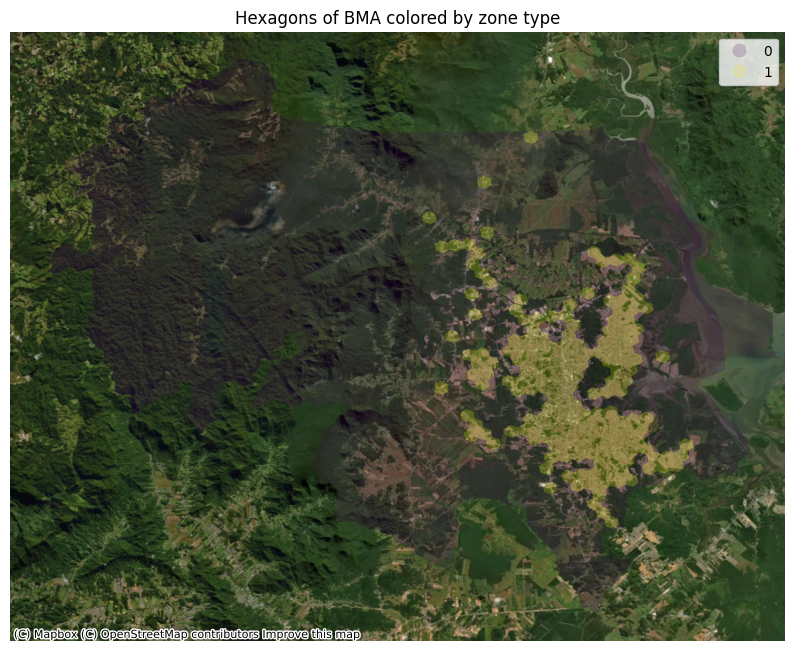

In [ ]:
ax = hex_gdf.clip(munis_to_plot.geometry.iloc[0]).plot(
    "urban_area",
    legend=True,
    categorical=True,
    alpha=0.2,
    figsize=(10, 10),
    cmap="viridis",
)

# Set title and legend
ax.set_title("Hexagons of BMA colored by zone type")

# Add basemap
cx.add_basemap(ax, crs=state.crs.to_string(), source=BASEMAP)

# Remove axis
ax.set_axis_off()

plt.savefig(
    f"outputs/maps/{STATE_ABBREV}/10-hexagon_urban.png", dpi=300, bbox_inches="tight"
)

plt.show()

We can see that the urban areas are correctly identified. Considering the satellite image, we can see that the urban areas are the ones with more buildings and roads.


In [354]:
# Print the number of hexagons with population and school data
print(
    "Number of hexagons with population data:",
    hex_gdf[hex_gdf["population_2020"].notna()].shape[0],
    "\nNumber of hexagons with school data:",
    hex_gdf[hex_gdf["code_school"].notna()].shape[0],
    "\nNumber of hexagons with population or school data:",
    hex_gdf[hex_gdf["population_2020"].notna() | hex_gdf["code_school"].notna()].shape[
        0
    ],
)

Number of hexagons with population data: 141875 
Number of hexagons with school data: 3488 
Number of hexagons with population or school data: 141875


In [355]:
# Finally, we can save the hexagons as a parquet file
hex_gdf.to_parquet(f"outputs/data/{STATE_ABBREV}/2025_08_01_hexs_final.parquet")

In [356]:
# Save the hexagons with population and school data
hex_gdf[hex_gdf["population_2020"].notna() | hex_gdf["code_school"].notna()].drop(
    "geometry", axis=1
).to_csv(f"outputs/data/{STATE_ABBREV}/2025_08_01_hexs_final.csv")

In [ ]:
# We can also export to other more human-readable formats but they are significantly slower & heavier

# hex_gdf.drop("geometry", axis=1).to_csv("outputs/23112023_para_hexs_final.csv")
# hex_gdf.to_file("outputs/23112023_para_hexs_final.geojson", driver="GeoJSON")

## Summary

We have extracted and processed schools and sociodemographic data from multiple source. The final results is a dataset on which each row is a H3 Hexagon. This will allow us to compare and analyze different microregions in Para. The variables obtained are the the following:

| Source                   | Variable name                       | Type        | Description                                                                       |
| ------------------------ | ----------------------------------- | ----------- | --------------------------------------------------------------------------------- |
| Meta's HRSM              | population_2020                     | Numerical   | Total Population                                                                  |
| IBGE's Census\*          | pop_3_5_years_adj                   | Numerical   | Population between 3 months and 5 years old                                       |
| IBGE's Census\*          | pop_6_14_years_adj                  | Numerical   | Population between 6 and 14 years old                                             |
| IBGE's Census\*          | pop_15_17_years_adj                 | Numerical   | Population between 15 and 17 years old                                            |
| IBGE's Census\*          | pop_18_years_adj                    | Numerical   | Population between 18 years old                                                   |
| IBGE's Census\*          | V002_adj                            | Numerical   | Total Population                                                                  |
| IBGE's Census\*          | V003_adj                            | Numerical   | Income (R$)                                                                       |
| INEP's School Census     | ensino_fundamental                  | Numerical   | Ensino Fundamental Schools Count                                                  |
| INEP's School Census     | educacao_infantil                   | Numerical   | Educacao Infantil Schools Count                                                   |
| INEP's School Census     | ensino_medio                        | Numerical   | Ensino Medio Schools Count                                                        |
| INEP's School Census     | educacao_jovens_adultos             | Numerical   | Educacao Jovens Adultos Schools Count                                             |
| INEP's School Census     | educacao_profissional               | Numerical   | Educacao Profissional Schools Count                                               |
| INEP's School Census     | no_specified                        | Numerical   | Count of schools with unspecified type                                            |
| INEP's School Census     | publica                             | Numerical   | Public Schools Count                                                              |
| INEP's School Census     | privada                             | Numerical   | Private Schools Count                                                             |
| Custom School Census\*\* | Matriculas totales                  | Numerical   | Total Enrolled Students                                                           |
| Custom School Census\*\* | Matrículas oficiales                | Numerical   | Oficially Enrolled Students                                                       |
| Custom School Census\*\* | matric*total*[school type]          | Numerical   | Enrolled Students by School Type                                                  |
| Custom School Census\*\* | matric*oficial*[school type]        | Numerical   | Enrolled Students by School Type                                                  |
| Custom School Census\*\* | diff*pop_matric_total*[school type] | Numerical   | Difference between target student population and enrolled students by School Type |
| Custom School Census\*\* | rate*pop_matric_total*[school type] | Numerical   | Ratio between target student population and enrolled students by School Type      |
| IBGE's Urban Footprints  | urban_area                          | Categorical | 1=Urban or 0=Rural                                                                |
| Ours                     | income_pc                           | Numerical   | Income Per Capita (R$)                                                            |

\* IBGE's Census: Variables where downscaled proportionally to Meta's high resolution population data.  
\*\* Custom School Census: This dataset was provided by IDB Education team in Brazil (need to ask for the source)
